In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 43.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.4 MB/s eta 0:00:000:00:010:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 1.9 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 31.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.3 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 88.6 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.8.93
    Uninstalling nvidia-nvjitlink-cu12-12.8.93:
      Successfully uninstalled nvidia-nvjitlink-cu12-12.8.93
  Attempting uninstall: nvidia-curand-cu12
    Found existing ins

In [61]:
import ultralytics
from ultralytics import YOLO
#import kagglehub
import os
from collections import Counter, defaultdict
#import shutil
import random
#from torch.utils.data import random_split
import torch
from PIL import Image
import matplotlib.pyplot as plt
#import yaml
#from torch import cuda
#from google.colab import files, drive
#import zipfile
from pathlib import Path
from IPython.display import Image, display

In [3]:
drive.mount('/content/drive')

Mounted at /content/drive


In [57]:
# Detect hardware
if torch.cuda.is_available():
    device = "cuda"
elif torch.backends.mps.is_available():
    device = "mps"
else:
    device = "cpu"
print(f"Using {device}")

Using cpu


In [16]:
# Upload file
# uploaded = files.upload()

In [5]:
# Define the path in Drive
drive_path = "/content/drive/My Drive"
project_path = os.path.join(drive_path, "Flood Damage Object Detection")
# Make sure the directory exists
# os.makedirs(project_path, exist_ok=True)

dataset_dir = os.path.join(project_path, "dataset")
# Make sure the directory exists
# os.makedirs(dataset_dir, exist_ok=True)

In [7]:
# Kaggle directory
dataset_path = "/kaggle/input/flood-damage-object-detection"
datasets_folders = os.path.join(dataset_path, "Dataset", "dataset")
os.listdir(datasets_folders)

['suspicious_files',
 'README.dataset.txt',
 'README.roboflow.txt',
 'data.yaml',
 'valid',
 'test',
 'train']

In [6]:
dataset_dir = r"C:\Users\abdul\Projects\Computer Vision\Object Detection in Flood Damage"

In [3]:
train_path = "train"
os.listdir(train_path)

['images', 'labels']

In [7]:
# Define directories
train_path = os.path.join(dataset_dir, "train")
train_image_path = os.path.join(train_path, "images")
train_label_path = os.path.join(train_path, "labels")
print("===== Train Folder =====")
print(f"Length of images in my train folder: {len(os.listdir(train_image_path))} images")
print(f"Length of labels in my train folder: {len(os.listdir(train_label_path))} labels")
test_path = os.path.join(dataset_dir, "test")
test_image_path = os.path.join(test_path, "images")
test_label_path = os.path.join(test_path, "labels")
print("===== Test Folder =====")
print(f"Length of images in my test folder: {len(os.listdir(test_image_path))} images")
print(f"Length of labels in my test folder: {len(os.listdir(test_label_path))} labels")
val_path = os.path.join(dataset_dir, "valid")
val_image_path = os.path.join(val_path, "images")
val_label_path = os.path.join(val_path, "labels")
print("===== Valid Folder =====")
print(f"Length of images in my valid folder: {len(os.listdir(val_image_path))} images")
print(f"Length of labels in my valid folder: {len(os.listdir(val_label_path))} labels")

===== Train Folder =====
Length of images in my train folder: 232 images
Length of labels in my train folder: 232 labels
===== Test Folder =====
Length of images in my test folder: 32 images
Length of labels in my test folder: 32 labels
===== Valid Folder =====
Length of images in my valid folder: 66 images
Length of labels in my valid folder: 66 labels


In [58]:
# Define directories
train_path = os.path.join("train")
train_image_path = os.path.join(train_path, "images")
train_label_path = os.path.join(train_path, "labels")
print("===== Train Folder =====")
print(f"Length of images in my train folder: {len(os.listdir(train_image_path))} images")
print(f"Length of labels in my train folder: {len(os.listdir(train_label_path))} labels")
test_path = os.path.join("test")
test_image_path = os.path.join(test_path, "images")
test_label_path = os.path.join(test_path, "labels")
print("===== Test Folder =====")
print(f"Length of images in my test folder: {len(os.listdir(test_image_path))} images")
print(f"Length of labels in my test folder: {len(os.listdir(test_label_path))} labels")
val_path = os.path.join("valid")
val_image_path = os.path.join(val_path, "images")
val_label_path = os.path.join(val_path, "labels")
print("===== Valid Folder =====")
print(f"Length of images in my valid folder: {len(os.listdir(val_image_path))} images")
print(f"Length of labels in my valid folder: {len(os.listdir(val_label_path))} labels")

===== Train Folder =====
Length of images in my train folder: 232 images
Length of labels in my train folder: 232 labels
===== Test Folder =====
Length of images in my test folder: 32 images
Length of labels in my test folder: 32 labels
===== Valid Folder =====
Length of images in my valid folder: 66 images
Length of labels in my valid folder: 66 labels


In [59]:
# Print the content in val_label_path
for label in os.listdir(val_label_path):
    path = os.path.join(val_label_path, label)
    #lines = []
    with open(path, 'r') as f:
        content = f.read()
        print(f"=== Content of {label} ===")
        print(content)

=== Content of flood_111_png.rf.b742b15233c89688e157c08b3a454ed2.txt ===
0 0.43515625 0.47890625 0.6875 0.36171875
=== Content of flood_130_png.rf.db64a0fe485d1a144a69ac968029c060.txt ===
1 0.54140625 0.49140625 0.15703125 0.21328125
1 0.78984375 0.35546875 0.06875 0.121875
=== Content of flood_131_png.rf.f15f9c6bd9923dba1330a884163eaae7.txt ===
1 0.515625 0.9546875 0.1125 0.0828125
1 0.6765625 0.7515625 0.11171875 0.09453125
1 0.63671875 0.5765625 0.08359375 0.12265625
1 0.39375 0.86953125 0.09609375 0.1453125
1 0.50234375 0.78828125 0.07109375 0.09609375
1 0.415625 0.6921875 0.08359375 0.08046875
1 0.52734375 0.63203125 0.12109375 0.059375
1 0.2421875 0.909375 0.12265625 0.07578125
1 0.2234375 0.9734375 0.10078125 0.04765625
0 0.87109375 0.571875 0.24453125 0.53359375
0 0.33984375 0.31171875 0.325 0.271875
0 0.11953125 0.51015625 0.22265625 0.46796875
0 0.6578125 0.209375 0.184375 0.33984375
1 0.5421875 0.72421875 0.07734375 0.06328125
=== Content of flood_140_png.rf.5bd3d76bfe357aca

In [84]:
total_counts = defaultdict(int)
label_dir = [train_label_path, test_label_path, val_label_path]
for label_folder in label_dir:
    class_counter = defaultdict(int)
    for label in os.listdir(label_folder):
        path = os.path.join(label_folder, label)
        with open(path, 'r') as f:
            for line in f:
                if line.strip():
                    class_id = int(line.strip()[0])
                    class_counter[class_id] += 1
                    total_counts[class_id] += 1
    print(f"\n Class Counts in {label_folder}")
    for class_id, count in sorted(class_counter.items()):
        print(f"Class Counts for {class_id}: {count}")
print(f"\n Total Class Counts Across All Folders:")
for class_id, count in sorted(total_counts.items()):
    print(f"Class Counts for {class_id}: {count}")

Count for train\labels
Class Counts in ['train\\labels', 'test\\labels', 'valid\\labels']
Class Counts for 0: 382
Class Counts for 1: 237
Class Counts for 2: 58
Class Counts for 3: 268
Count for test\labels
Class Counts in ['train\\labels', 'test\\labels', 'valid\\labels']
Class Counts for 0: 54
Class Counts for 1: 26
Class Counts for 2: 13
Class Counts for 3: 20
Count for valid\labels
Class Counts in ['train\\labels', 'test\\labels', 'valid\\labels']
Class Counts for 0: 69
Class Counts for 1: 80
Class Counts for 2: 13
Class Counts for 3: 87
Total Class Counts Across All Folders:
Class Counts for 0: 505
Class Counts for 1: 343
Class Counts for 2: 84
Class Counts for 3: 375


In [85]:
# Print the content in train_label_path
for label in os.listdir(train_label_path):
    path = os.path.join(train_label_path, label)
    #lines = []
    with open(path, 'r') as f:
        content = f.read()
        print(f"=== Content of {label} ===")
        print(content)

=== Content of flood_102_png.rf.e7ca87377d2220e0b8944dd7046a6f40.txt ===
1 0.13984375 0.3734375 0.2796875 0.2234375
1 0.50859375 0.36015625 0.2015625 0.17734375
1 0.590625 0.40078125 0.184375 0.1625
0 0.75234375 0.315625 0.4953125 0.63125
=== Content of flood_103_png.rf.1f8a1334a3cea1f8175274506ed6e94b.txt ===
0 0.1375 0.4953125 0.2640625 0.990625
0 0.35078125 0.5421875 0.3140625 0.67109375
0 0.72734375 0.4828125 0.5125 0.9546875
=== Content of flood_104_png.rf.cce58c46f032147615566cea1d2ed672.txt ===
0 0.3703125 0.30390625 0.19609375 0.12421875
0 0.3578125 0.41484375 0.1578125 0.10703125
0 0.37421875 0.5296875 0.14140625 0.11796875
0 0.4046875 0.64375 0.16484375 0.109375
0 0.41796875 0.759375 0.18671875 0.1140625
0 0.4328125 0.9109375 0.2109375 0.13125
0 0.2578125 0.8875 0.16875 0.184375
0 0.2046875 0.36484375 0.14921875 0.1859375
0 0.0765625 0.359375 0.13125 0.1828125
0 0.12265625 0.9203125 0.1671875 0.1296875
0 0.05 0.0921875 0.1 0.184375
0 0.16640625 0.1046875 0.1609375 0.209375
0 

In [86]:
# Redefine class_id '3' as '2'
class_id_mapping = {'3': '2'}
def fix_class_id(label_file):
    with open(label_file, 'r') as f:
        lines = f.readlines()
    updated_lines = []
    for line in lines:
        values = line.split()
        if values:
            class_id = values[0]
            if class_id in class_id_mapping:
                values[0] = class_id_mapping[class_id]
            updated_lines.append(' '.join(values) + '\n')
    with open(label_file, 'w') as f:
        f.writelines(updated_lines)

# Fix train_label_path
for train_label in os.listdir(train_label_path):
    train_path = os.path.join(train_label_path, train_label)
    fix_class_id(train_path)
print(f"Fixed label files: {train_label_path}")

# Fix test_label_path
for test_label in os.listdir(test_label_path):
    test_path = os.path.join(test_label_path, test_label)
    fix_class_id(test_path)
print(f"Fixed label files: {test_label_path}")

# Fix val_label_path
for val_label in os.listdir(val_label_path):
    val_path = os.path.join(val_label_path, val_label)
    fix_class_id(val_path)
print(f"Fixed label files: {val_label_path}")

Fixed label files: train\labels
Fixed label files: train\labels
Fixed label files: train\labels
Fixed label files: train\labels
Fixed label files: train\labels
Fixed label files: train\labels
Fixed label files: train\labels
Fixed label files: train\labels
Fixed label files: train\labels
Fixed label files: train\labels
Fixed label files: train\labels
Fixed label files: train\labels
Fixed label files: train\labels
Fixed label files: train\labels
Fixed label files: train\labels
Fixed label files: train\labels
Fixed label files: train\labels
Fixed label files: train\labels
Fixed label files: train\labels
Fixed label files: train\labels
Fixed label files: train\labels
Fixed label files: train\labels
Fixed label files: train\labels
Fixed label files: train\labels
Fixed label files: train\labels
Fixed label files: train\labels
Fixed label files: train\labels
Fixed label files: train\labels
Fixed label files: train\labels
Fixed label files: train\labels
Fixed label files: train\labels
Fixed la

In [89]:
total_counts = defaultdict(int)
label_dir = [train_label_path, test_label_path, val_label_path]
for label_folder in label_dir:
    class_counter = defaultdict(int)
    for label in os.listdir(label_folder):
        path = os.path.join(label_folder, label)
        with open(path, 'r') as f:
            for line in f:
                if line.strip():
                    class_id = int(line.strip()[0])
                    class_counter[class_id] += 1
                    total_counts[class_id] += 1
    print(f"\n Class Counts in {label_folder}")
    for class_id, count in sorted(class_counter.items()):
        print(f"Class Counts for {class_id}: {count}")
print(f"\n Total Class Counts Across All Folders:")
for class_id, count in sorted(total_counts.items()):
    print(f"Class Counts for {class_id}: {count}")


 Class Counts in train\labels
Class Counts for 0: 382
Class Counts for 1: 237
Class Counts for 2: 326

 Class Counts in test\labels
Class Counts for 0: 54
Class Counts for 1: 26
Class Counts for 2: 33

 Class Counts in valid\labels
Class Counts for 0: 69
Class Counts for 1: 80
Class Counts for 2: 100

 Total Class Counts Across All Folders:
Class Counts for 0: 505
Class Counts for 1: 343
Class Counts for 2: 459


In [88]:
# Print the content in val_label_path
for label in os.listdir(val_label_path):
    path = os.path.join(val_label_path, label)
    #lines = []
    with open(path, 'r') as f:
        content = f.read()
        print(f"=== Content of {label} ===")
        print(content)

=== Content of flood_111_png.rf.b742b15233c89688e157c08b3a454ed2.txt ===
0 0.43515625 0.47890625 0.6875 0.36171875

=== Content of flood_130_png.rf.db64a0fe485d1a144a69ac968029c060.txt ===
1 0.54140625 0.49140625 0.15703125 0.21328125
1 0.78984375 0.35546875 0.06875 0.121875

=== Content of flood_131_png.rf.f15f9c6bd9923dba1330a884163eaae7.txt ===
1 0.515625 0.9546875 0.1125 0.0828125
1 0.6765625 0.7515625 0.11171875 0.09453125
1 0.63671875 0.5765625 0.08359375 0.12265625
1 0.39375 0.86953125 0.09609375 0.1453125
1 0.50234375 0.78828125 0.07109375 0.09609375
1 0.415625 0.6921875 0.08359375 0.08046875
1 0.52734375 0.63203125 0.12109375 0.059375
1 0.2421875 0.909375 0.12265625 0.07578125
1 0.2234375 0.9734375 0.10078125 0.04765625
0 0.87109375 0.571875 0.24453125 0.53359375
0 0.33984375 0.31171875 0.325 0.271875
0 0.11953125 0.51015625 0.22265625 0.46796875
0 0.6578125 0.209375 0.184375 0.33984375
1 0.5421875 0.72421875 0.07734375 0.06328125

=== Content of flood_140_png.rf.5bd3d76bfe357

In [6]:
# Unzip into Google Drive

# with zipfile.ZipFile("Flood Object Detection.v1i.yolov8.zip", 'r') as zip_ref:
  #  zip_ref.extractall(dataset_dir)
print(f"Number of folders in my dataset: {len(os.listdir(dataset_dir))}")

Number of folders in my dataset: 6


In [8]:
print(f"Folders in my dataset: {os.listdir(dataset_dir)}")

Folders in my dataset: ['.ipynb_checkpoints', 'data.yaml', 'Flood Object Detection.v1i.yolov8.zip', 'Object Detection In Flood Damage.ipynb', 'obj_best_flood.pt', 'README.dataset.txt', 'README.roboflow.txt', 'test', 'train', 'valid']


In [31]:
# Define the path to your dataset directory and the file
file_path = os.path.join(dataset_dir, 'README.roboflow.txt')

# Read and print the content of the file
with open(file_path, 'r') as file:
    readme_content = file.read()

print(readme_content)


Flood Object Detection - v1 2023-12-05 8:28pm

This dataset was exported via roboflow.com on December 9, 2023 at 11:26 PM GMT

Roboflow is an end-to-end computer vision platform that helps you
* collaborate with your team on computer vision projects
* collect & organize images
* understand and search unstructured image data
* annotate, and create datasets
* export, train, and deploy computer vision models
* use active learning to improve your dataset over time

For state of the art Computer Vision training notebooks you can use with this dataset,
visit https://github.com/roboflow/notebooks

To find over 100k other datasets and pre-trained models, visit https://universe.roboflow.com

The dataset includes 330 images.
Flooded-building-car-people are annotated in YOLOv8 format.

The following pre-processing was applied to each image:
* Auto-orientation of pixel data (with EXIF-orientation stripping)
* Resize to 640x640 (Stretch)

No image augmentation techniques were applied.





In [9]:
# Read and print the content of the file
data_yaml_path = os.path.join(dataset_dir, 'data.yaml')
with open(data_yaml_path, 'r') as file:
    yaml_content = file.read()

print(yaml_content)

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 4
names: ['flooded_building', 'flooded_car', 'person', 'person_in_help']

roboflow:
  workspace: columbia-university-d9ggz
  project: flood-object-detection-2olqp
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/columbia-university-d9ggz/flood-object-detection-2olqp/dataset/1


In [8]:
# Define directories
train_path = os.path.join(dataset_dir, "train")
train_image_path = os.path.join(train_path, "images")
train_label_path = os.path.join(train_path, "labels")
print("===== Train Folder =====")
print(f"Length of images in my train folder: {len(os.listdir(train_image_path))} images")
print(f"Length of labels in my train folder: {len(os.listdir(train_label_path))} labels")
test_path = os.path.join(dataset_dir, "test")
test_image_path = os.path.join(test_path, "images")
test_label_path = os.path.join(test_path, "labels")
print("===== Test Folder =====")
print(f"Length of images in my test folder: {len(os.listdir(test_image_path))} images")
print(f"Length of labels in my test folder: {len(os.listdir(test_label_path))} labels")
val_path = os.path.join(dataset_dir, "valid")
val_image_path = os.path.join(val_path, "images")
val_label_path = os.path.join(val_path, "labels")
print("===== Valid Folder =====")
print(f"Length of images in my valid folder: {len(os.listdir(val_image_path))} images")
print(f"Length of labels in my valid folder: {len(os.listdir(val_label_path))} labels")

===== Train Folder =====
Length of images in my train folder: 232 images
Length of labels in my train folder: 232 labels
===== Test Folder =====
Length of images in my test folder: 32 images
Length of labels in my test folder: 32 labels
===== Valid Folder =====
Length of images in my valid folder: 66 images
Length of labels in my valid folder: 66 labels


In [24]:

from collections import defaultdict
# Function to count occurrences of each class in a label file
def count_classes_in_labels(label_dir):
    class_count = defaultdict(int)

    # Iterate through all label files
    for label_file in os.listdir(label_dir):
        if label_file.endswith('.txt'):  # Assuming labels are .txt files
            with open(os.path.join(label_dir, label_file), 'r') as file:
                for line in file:
                    class_id = int(line.strip().split()[0])  # The first value is the class id
                    class_count[class_id] += 1
    return class_count

# Function to check class distribution for each dataset split (train, test, valid)
def get_class_distribution():
    # Paths to the label directories
    train_label_path = os.path.join(dataset_dir, "train", "labels")
    test_label_path = os.path.join(dataset_dir, "test", "labels")
    val_label_path = os.path.join(dataset_dir, "valid", "labels")

    # Count classes for each dataset split
    train_class_count = count_classes_in_labels(train_label_path)
    test_class_count = count_classes_in_labels(test_label_path)
    val_class_count = count_classes_in_labels(val_label_path)

    # Combine class counts from all splits
    total_class_count = defaultdict(int)
    for class_id, count in train_class_count.items():
        total_class_count[class_id] += count
    for class_id, count in test_class_count.items():
        total_class_count[class_id] += count
    for class_id, count in val_class_count.items():
        total_class_count[class_id] += count

    return total_class_count

# Calculate and print the class distribution
class_distribution = get_class_distribution()

# Print class distribution
print("===== Class Distribution =====")
for class_id, count in sorted(class_distribution.items()):
    print(f"Class {class_id}: {count} occurrences")

# Define a threshold for underrepresentation (e.g., less than 10 occurrences)
threshold = 10
underrepresented_classes = {class_id: count for class_id, count in class_distribution.items() if count < threshold}

# Print underrepresented classes
if underrepresented_classes:
    print("\n===== Underrepresented Classes =====")
    for class_id, count in underrepresented_classes.items():
        print(f"Class {class_id}: {count} occurrences (underrepresented)")
else:
    print("\nNo underrepresented classes detected.")

===== Class Distribution =====
Class 0: 505 occurrences
Class 1: 343 occurrences
Class 2: 84 occurrences
Class 3: 375 occurrences

No underrepresented classes detected.


In [26]:
# Change class_id

# Define all label folders
label_dirs = [
    "/content/drive/My Drive/Flood Damage Object Detection/dataset/train/labels",
    "/content/drive/My Drive/Flood Damage Object Detection/dataset/valid/labels",
    "/content/drive/My Drive/Flood Damage Object Detection/dataset/test/labels"
]

# Loop over each directory and process label files
for label_dir in label_dirs:
    for filename in os.listdir(label_dir):
        if filename.endswith(".txt"):
            file_path = os.path.join(label_dir, filename)
            with open(file_path, "r") as f:
                lines = f.readlines()

            new_lines = []
            for line in lines:
                if line.strip():
                    parts = line.strip().split()
                    class_id = int(parts[0])
                    if class_id == 3:
                        parts[0] = "2"  # Change class 3 to class 2
                    new_line = " ".join(parts)
                    new_lines.append(new_line)

            # Overwrite the file with updated lines
            with open(file_path, "w") as f:
                f.write("\n".join(new_lines) + "\n")

print("✅ All class 3 labels successfully converted to class 2 ('person').")

✅ All class 3 labels successfully converted to class 2 ('person').


In [30]:
# Define label directories
label_dirs = [
    "/content/drive/My Drive/Flood Damage Object Detection/dataset/train/labels",
    "/content/drive/My Drive/Flood Damage Object Detection/dataset/valid/labels",
    "/content/drive/My Drive/Flood Damage Object Detection/dataset/test/labels"
]

# Function to count valid and malformed lines
def count_valid_malformed_lines(label_dirs):
    total_valid_lines = 0
    total_malformed_lines = 0

    # Iterate through the label directories and count lines
    for label_dir in label_dirs:
        label_dir_path = Path(label_dir)
        for label_file in label_dir_path.glob("*.txt"):
            with label_file.open("r") as f:
                lines = f.readlines()

            # Check each line for validity
            valid_lines = [line for line in lines if line.strip() and len(line.strip().split()) == 5]
            malformed_lines = [line for line in lines if not line.strip() or len(line.strip().split()) != 5]

            # Update total valid and malformed line counts
            total_valid_lines += len(valid_lines)
            total_malformed_lines += len(malformed_lines)

    # Print the result
    print(f"Total valid lines: {total_valid_lines}")
    print(f"Total malformed lines: {total_malformed_lines}")

# Run the function
count_valid_malformed_lines(label_dirs)

Total valid lines: 1307
Total malformed lines: 14


In [32]:
# Check label files for empty or malformed lines after conversion
suspicious_files = {}

# Loop through all label files
for label_dir in label_dirs:
    label_dir_path = Path(label_dir)
    for label_file in label_dir_path.glob("*.txt"):
        with label_file.open("r") as f:
            lines = f.readlines()

        # Any line that is empty or has fewer than 5 components (class + 4 box coords)
        bad_lines = [line for line in lines if not line.strip() or len(line.strip().split()) < 5]

        if bad_lines:
            suspicious_files[str(label_file)] = bad_lines

# Loop through suspicious files and print each line in the proper label format
for file, bad_lines in suspicious_files.items():
    print(f"\nFile: {file}")

    # Read and print content of each file for inspection
    with open(file, 'r') as f:
        content = f.read().strip()  # Read the entire content of the label file
        print("Full content of the file:")
        print(content)  # This will print the whole label data (e.g., "0 x_center y_center width height")

    # Now, print out the bad lines separately if needed
    for line in bad_lines:
        print(f"  Malformed line: {line.strip()}")  # Print each malformed line in the file


File: /content/drive/My Drive/Flood Damage Object Detection/dataset/train/labels/flood_292_png.rf.6969ba4d975405ff19db98767be2f846.txt
Full content of the file:

  Malformed line: 

File: /content/drive/My Drive/Flood Damage Object Detection/dataset/train/labels/flood_295_png.rf.78f057748b04a8b15df5799bbe90f518.txt
Full content of the file:

  Malformed line: 

File: /content/drive/My Drive/Flood Damage Object Detection/dataset/train/labels/flood_399_png.rf.3f7499691396912060087bcfdb282c7f.txt
Full content of the file:

  Malformed line: 

File: /content/drive/My Drive/Flood Damage Object Detection/dataset/train/labels/flood_540_png.rf.754af8e964d254acb83f7b5c5d7360b6.txt
Full content of the file:

  Malformed line: 

File: /content/drive/My Drive/Flood Damage Object Detection/dataset/train/labels/flood_57_png.rf.f81b25c05465dc9a09a075541307fc99.txt
Full content of the file:

  Malformed line: 

File: /content/drive/My Drive/Flood Damage Object Detection/dataset/train/labels/flood_644

In [35]:
# Move malformed labels and corresponding images
# Define image directories

image_dirs = [
    "/content/drive/My Drive/Flood Damage Object Detection/dataset/train/images",
    "/content/drive/My Drive/Flood Damage Object Detection/dataset/valid/images",
    "/content/drive/My Drive/Flood Damage Object Detection/dataset/test/images"
]

# Directory to move suspicious files
move_dir = "/content/drive/My Drive/Flood Damage Object Detection/dataset/suspicious_files"

# Create the directory if it doesn't exist
Path(move_dir).mkdir(parents=True, exist_ok=True)

# Check label files for empty or malformed lines after conversion
suspicious_files = {}

# Loop through all label files and identify the suspicious ones
for label_dir, image_dir in zip(label_dirs, image_dirs):
    label_dir_path = Path(label_dir)
    image_dir_path = Path(image_dir)

    for label_file in label_dir_path.glob("*.txt"):
        with label_file.open("r") as f:
            lines = f.readlines()

        # Any line that is empty or has fewer than 5 components (class + 4 box coords)
        bad_lines = [line for line in lines if not line.strip() or len(line.strip().split()) < 5]

        if bad_lines:
            suspicious_files[str(label_file)] = bad_lines

# Now, move the suspicious files and their corresponding image files
for file, bad_lines in suspicious_files.items():
    print(f"\nMoving suspicious file: {file}")
    # Move the label file
    label_dest = Path(move_dir) / Path(file).name
    shutil.move(file, label_dest)

    # Move the corresponding image file by replacing the label file extension with '.jpg', '.png', etc.
    image_file = Path(file).with_suffix('.jpg')  # Change '.jpg' to the correct extension of your images if necessary.
    if image_file.exists():
        image_dest = Path(move_dir) / image_file.name
        print(f"  Moving corresponding image file: {image_file}")
        shutil.move(image_file, image_dest)

print("Suspicious files and corresponding images have been moved to:", move_dir)


Moving suspicious file: /content/drive/My Drive/Flood Damage Object Detection/dataset/train/labels/flood_292_png.rf.6969ba4d975405ff19db98767be2f846.txt

Moving suspicious file: /content/drive/My Drive/Flood Damage Object Detection/dataset/train/labels/flood_295_png.rf.78f057748b04a8b15df5799bbe90f518.txt

Moving suspicious file: /content/drive/My Drive/Flood Damage Object Detection/dataset/train/labels/flood_399_png.rf.3f7499691396912060087bcfdb282c7f.txt

Moving suspicious file: /content/drive/My Drive/Flood Damage Object Detection/dataset/train/labels/flood_540_png.rf.754af8e964d254acb83f7b5c5d7360b6.txt

Moving suspicious file: /content/drive/My Drive/Flood Damage Object Detection/dataset/train/labels/flood_57_png.rf.f81b25c05465dc9a09a075541307fc99.txt

Moving suspicious file: /content/drive/My Drive/Flood Damage Object Detection/dataset/train/labels/flood_644_png.rf.be90882ad0b234e7a5c0a2885f7e5fa9.txt

Moving suspicious file: /content/drive/My Drive/Flood Damage Object Detectio

In [36]:

from collections import defaultdict
# Function to count occurrences of each class in a label file
def count_classes_in_labels(label_dir):
    class_count = defaultdict(int)

    # Iterate through all label files
    for label_file in os.listdir(label_dir):
        if label_file.endswith('.txt'):  # Assuming labels are .txt files
            with open(os.path.join(label_dir, label_file), 'r') as file:
                for line in file:
                    class_id = int(line.strip().split()[0])  # The first value is the class id
                    class_count[class_id] += 1
    return class_count

# Function to check class distribution for each dataset split (train, test, valid)
def get_class_distribution():

    # Count classes for each dataset split
    train_class_count = count_classes_in_labels(train_label_path)
    test_class_count = count_classes_in_labels(test_label_path)
    val_class_count = count_classes_in_labels(val_label_path)

    # Combine class counts from all splits
    total_class_count = defaultdict(int)
    for class_id, count in train_class_count.items():
        total_class_count[class_id] += count
    for class_id, count in test_class_count.items():
        total_class_count[class_id] += count
    for class_id, count in val_class_count.items():
        total_class_count[class_id] += count

    return total_class_count

# Calculate and print the class distribution
class_distribution = get_class_distribution()

# Print class distribution
print("===== Class Distribution =====")
for class_id, count in sorted(class_distribution.items()):
    print(f"Class {class_id}: {count} occurrences")

===== Class Distribution =====
Class 0: 505 occurrences
Class 1: 343 occurrences
Class 2: 459 occurrences


In [48]:
# List first three files in directory
print("===== Train Folder =====")
print(f"First 5 files in image train directory: \n {os.listdir(train_image_path)[:3]}")
print(f"First 5 files in label train directory: \n {os.listdir(train_label_path)[:3]}")
print("\n")
print("===== Test Folder =====")
print(f"First 5 files in image test directory: \n {os.listdir(test_image_path)[:3]}")
print(f"First 5 files in label test directory: \n {os.listdir(test_label_path)[:3]}")
print("\n")
print("===== Valid Folder =====")
print(f"First 5 files in image valid directory: \n {os.listdir(val_image_path)[:3]}")
print(f"First 5 files in label valid directory: \n {os.listdir(val_label_path)[:3]}")

===== Train Folder =====
First 5 files in image train directory: 
 ['flood_102_png.rf.e7ca87377d2220e0b8944dd7046a6f40.jpg', 'flood_103_png.rf.1f8a1334a3cea1f8175274506ed6e94b.jpg', 'flood_104_png.rf.cce58c46f032147615566cea1d2ed672.jpg']
First 5 files in label train directory: 
 ['flood_102_png.rf.e7ca87377d2220e0b8944dd7046a6f40.txt', 'flood_103_png.rf.1f8a1334a3cea1f8175274506ed6e94b.txt', 'flood_104_png.rf.cce58c46f032147615566cea1d2ed672.txt']


===== Test Folder =====
First 5 files in image test directory: 
 ['flood_109_png.rf.46563eb62539a9cd4028aedc7f18bbbf.jpg', 'flood_128_png.rf.5ba4d00893a6cbfd160c6aca1f93e079.jpg', 'flood_12_png.rf.0b989f7f930153760276c01887af3844.jpg']
First 5 files in label test directory: 
 ['flood_109_png.rf.46563eb62539a9cd4028aedc7f18bbbf.txt', 'flood_128_png.rf.5ba4d00893a6cbfd160c6aca1f93e079.txt', 'flood_12_png.rf.0b989f7f930153760276c01887af3844.txt']


===== Valid Folder =====
First 5 files in image valid directory: 
 ['flood_111_png.rf.b742b1523

In [49]:
# Label Example
with open(os.path.join(val_label_path, 'flood_111_png.rf.b742b15233c89688e157c08b3a454ed2.txt')) as f:
    print(f.read())  # Should show "0 x_center y_center width height"

0 0.43515625 0.47890625 0.6875 0.36171875


In [58]:


# Function to count unique class IDs in a given label directory
def count_unique_class_ids(label_path):
    class_ids = set()  # Use a set to store unique class IDs

    # Iterate over label files in the directory
    for label_file in os.listdir(label_path):
        if label_file.endswith('.txt'):  # Only process text files
            label_file_path = os.path.join(label_path, label_file)

            # Open and read the label file
            with open(label_file_path, 'r') as f:
                lines = f.readlines()
                for line in lines:
                    class_id = int(line.split()[0])  # Get the class ID (first value in each line)
                    class_ids.add(class_id)  # Add the class ID to the set

    return class_ids

# Count unique class IDs in each directory
train_unique_classes = count_unique_class_ids(train_label_path)
test_unique_classes = count_unique_class_ids(test_label_path)
val_unique_classes = count_unique_class_ids(val_label_path)

# Print the results
print("Unique class IDs in train set:", train_unique_classes)
print("Unique class IDs in test set:", test_unique_classes)
print("Unique class IDs in validation set:", val_unique_classes)

# Total unique class IDs across all sets
all_unique_classes = train_unique_classes.union(test_unique_classes, val_unique_classes)
print("Total unique class IDs across all sets:", all_unique_classes)

Unique class IDs in train set: {0, 1, 2, 3}
Unique class IDs in test set: {0, 1, 2, 3}
Unique class IDs in validation set: {0, 1, 2, 3}
Total unique class IDs across all sets: {0, 1, 2, 3}


In [11]:
# Function to load class names from data.yaml
def load_class_names(yaml_path):
    with open(yaml_path, 'r') as f:
        data = yaml.safe_load(f)  # Load YAML content
        return data['names']  # Return the 'names' list from the YAML

# Load class names from data.yaml
class_names = load_class_names(data_yaml_path)
class_names

['flooded_building', 'flooded_car', 'person', 'person_in_help']

In [37]:
# Check if class name present in yolo_values
yolo = YOLO('yolov8m.pt')
print("Result:")
for name in class_names:
  print(f"Absence of: {name} = {name not in yolo.names.values()}")

Result:
Absence of: flooded_building = True
Absence of: flooded_car = True
Absence of: person = False
Absence of: person_in_help = True


In [16]:
# Function to display images from a given directory
def display_images(image_path, num_images_to_display=3):
    # Get image file paths
    image_files = [os.path.join(image_path, f) for f in os.listdir(image_path)
                   if f.lower().endswith(('.jpg', '.jpeg', '.png'))]  # Filter images only

    print(f"Number of images found in {image_path}: {len(image_files)}")

    # Select images to display (up to `num_images_to_display`)
    images_to_display = image_files[:num_images_to_display]

    # Set grid size (3 images per row)
    cols = 3  # Number of columns
    rows = (len(images_to_display) // cols) + (len(images_to_display) % cols > 0)  # Dynamic row count

    plt.figure(figsize=(12, 8))  # Adjust figure size

    for idx, img_full_path in enumerate(images_to_display, 1):
        try:
            image = Image.open(img_full_path)  # Open image using PIL
            plt.subplot(rows, cols, idx)
            plt.imshow(image)
            plt.axis('off')
            plt.title(os.path.basename(img_full_path), fontsize=8)
        except Exception as e:
            print(f"Error with {img_full_path}: {str(e)}")  # More detailed error

    plt.tight_layout()
    plt.show()

# Display images for train, test, and valid directories
print("===== Train Images =====")
display_images(train_image_path)

print("===== Test Images =====")
display_images(test_image_path)

print("===== Valid Images =====")
display_images(val_image_path)

Output hidden; open in https://colab.research.google.com to view.

In [38]:
# Create a .yaml file

# Define dataset paths
data_config = {
    "train": "/content/drive/My Drive/Flood Damage Object Detection/dataset/train/images",
    "val": "/content/drive/My Drive/Flood Damage Object Detection/dataset/valid/images",
    "test": "/content/drive/My Drive/Flood Damage Object Detection/dataset/test/images",
    "nc": 3,  # Number of classes
    "names": ['flooded_building', 'flooded_car', 'person']  # Class names
}

# Save to YAML file
yaml_path = "/content/drive/My Drive/Flood Damage Object Detection/dataset/data.yaml"
with open(yaml_path, "w") as f:
    yaml.dump(data_config, f, default_flow_style=False)

print(f"data.yaml saved at {yaml_path}")

data.yaml saved at /content/drive/My Drive/Flood Damage Object Detection/dataset/data.yaml


In [ ]:
# Load YOLOv8 model
model = YOLO('yolov8m.pt').to(device)

print("Training started successfully!")

# Train with data augmentation enabled and save to Drive
model.train(
    data='/content/drive/My Drive/Flood Damage Object Detection/dataset/data.yaml',  # Path to data.yaml
    epochs=10000,                      # Number of training epochs
    imgsz=640,                      # Image size
    batch=16,
    project="/content/drive/MyDrive/yolo_runs",
    name="flood damage object detection",
    save_period=100,
    augment=True,                   # Enable data augmentation
    patience= 100,                    # Lower patience to prevent overtraining
    lr0=0.001,
    mixup=0.3,  # Introduce more mixup augmentation
    mosaic=True, # Make sure mosaic augmentation is enabled
    warmup_epochs=3,               # Help stabilize early training
    cos_lr=True                     # Cosine learning rate decay
)

Training started successfully!
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/drive/My Drive/Flood Damage Object Detection/dataset/data.yaml, degrees=0.0, deterministic=True, device=cuda:0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10000, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.3, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=True, multi_scale=False, name=flood damage object detection6, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, 

train: Scanning /content/drive/My Drive/Flood Damage Object Detection/dataset/train/labels... 221 images, 11 backgrounds, 0 corrupt: 100%|██████████| 232/232 [00:01<00:00, 139.67it/s]


train: New cache created: /content/drive/My Drive/Flood Damage Object Detection/dataset/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 4.0±3.7 ms, read: 22.8±17.8 MB/s, size: 67.0 KB)


val: Scanning /content/drive/My Drive/Flood Damage Object Detection/dataset/valid/labels... 65 images, 1 backgrounds, 0 corrupt: 100%|██████████| 66/66 [00:00<00:00, 68.41it/s]


val: New cache created: /content/drive/My Drive/Flood Damage Object Detection/dataset/valid/labels.cache
Plotting labels to /content/drive/MyDrive/yolo_runs/flood damage object detection6/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/yolo_runs/flood damage object detection6
Starting training for 10000 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    1/10000      6.23G      2.401      3.651      2.435         64        640: 100%|██████████| 15/15 [00:09<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.64it/s]

                   all         66        249      0.154      0.117     0.0701     0.0273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    2/10000      7.38G      2.198      2.655      2.192         78        640: 100%|██████████| 15/15 [00:09<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.05it/s]

                   all         66        249       0.38      0.271       0.24     0.0951



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    3/10000      6.43G      2.159      2.446      2.089        120        640: 100%|██████████| 15/15 [00:08<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.67it/s]

                   all         66        249      0.503      0.294      0.312      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    4/10000      6.38G      2.067      2.237      1.987         83        640: 100%|██████████| 15/15 [00:07<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.22it/s]

                   all         66        249      0.444      0.348      0.311      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    5/10000       6.4G      2.004      2.261       1.93         46        640: 100%|██████████| 15/15 [00:08<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.21it/s]

                   all         66        249      0.405      0.373      0.325      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    6/10000      6.41G      1.927      2.304      1.862         51        640: 100%|██████████| 15/15 [00:08<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.22it/s]

                   all         66        249       0.41      0.299      0.288      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    7/10000      6.47G      1.945       2.22      1.849         76        640: 100%|██████████| 15/15 [00:08<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.34it/s]

                   all         66        249      0.376        0.3      0.266     0.0993



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    8/10000      6.47G      1.908      2.248      1.829        113        640: 100%|██████████| 15/15 [00:07<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.58it/s]

                   all         66        249      0.291      0.291      0.247     0.0928



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    9/10000      6.34G      1.922      2.045      1.826         45        640: 100%|██████████| 15/15 [00:07<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.99it/s]

                   all         66        249       0.27      0.327      0.227     0.0863



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   10/10000      6.19G      1.882      1.982      1.793         84        640: 100%|██████████| 15/15 [00:08<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.97it/s]

                   all         66        249      0.411      0.395      0.333      0.125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   11/10000      7.37G      1.907      1.944       1.84         70        640: 100%|██████████| 15/15 [00:08<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.78it/s]

                   all         66        249      0.357      0.307      0.286      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   12/10000       6.5G      1.901      1.956      1.843         79        640: 100%|██████████| 15/15 [00:09<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all         66        249      0.351      0.227      0.205      0.081



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   13/10000      6.33G      1.886      1.941      1.811         81        640: 100%|██████████| 15/15 [00:07<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.81it/s]

                   all         66        249      0.508      0.334      0.311      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   14/10000      6.51G      1.875      1.905      1.801         98        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.49it/s]

                   all         66        249      0.393      0.316      0.298      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   15/10000      6.46G      1.835      1.792      1.789         53        640: 100%|██████████| 15/15 [00:08<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.95it/s]

                   all         66        249      0.374      0.322      0.273     0.0985



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   16/10000      6.41G      1.852      1.811      1.804         83        640: 100%|██████████| 15/15 [00:08<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.95it/s]

                   all         66        249      0.324      0.224      0.175     0.0607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   17/10000      6.31G      1.856      1.859      1.855         55        640: 100%|██████████| 15/15 [00:08<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.22it/s]

                   all         66        249      0.431      0.334      0.284     0.0999



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   18/10000      6.45G      1.853      1.826      1.814         46        640: 100%|██████████| 15/15 [00:09<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]

                   all         66        249      0.361       0.41      0.316      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   19/10000      6.48G      1.813       1.82      1.807         70        640: 100%|██████████| 15/15 [00:07<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.05it/s]

                   all         66        249      0.454      0.281      0.287     0.0976



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   20/10000      6.38G      1.782       1.78      1.789         66        640: 100%|██████████| 15/15 [00:08<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.03it/s]

                   all         66        249      0.369      0.258       0.21     0.0718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   21/10000      6.31G      1.859      1.855      1.836        112        640: 100%|██████████| 15/15 [00:08<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.45it/s]

                   all         66        249      0.365      0.397      0.307      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   22/10000      6.42G      1.811      1.813      1.806         51        640: 100%|██████████| 15/15 [00:08<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.08it/s]

                   all         66        249      0.376      0.379      0.262     0.0806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   23/10000      6.41G      1.786      1.756      1.804         58        640: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.91it/s]

                   all         66        249      0.336      0.407      0.303     0.0977



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   24/10000      6.51G      1.806      1.721       1.79         90        640: 100%|██████████| 15/15 [00:08<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.01it/s]

                   all         66        249      0.467       0.37      0.339      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   25/10000      6.31G      1.763      1.721      1.785         59        640: 100%|██████████| 15/15 [00:10<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.89it/s]

                   all         66        249      0.383      0.356      0.279     0.0999



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   26/10000      6.47G       1.77      1.689      1.783         46        640: 100%|██████████| 15/15 [00:08<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.38it/s]

                   all         66        249      0.423      0.344      0.318      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   27/10000      6.49G      1.752      1.598      1.724        123        640: 100%|██████████| 15/15 [00:07<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.46it/s]

                   all         66        249      0.438      0.346      0.333      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   28/10000      6.47G      1.685      1.621      1.695         63        640: 100%|██████████| 15/15 [00:07<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  3.00it/s]

                   all         66        249      0.437      0.326      0.306      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   29/10000      6.43G      1.751      1.656      1.739         47        640: 100%|██████████| 15/15 [00:09<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.43it/s]

                   all         66        249      0.426      0.329      0.308      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   30/10000      6.48G      1.676      1.541      1.682         94        640: 100%|██████████| 15/15 [00:08<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all         66        249      0.485      0.331      0.345      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   31/10000      6.19G      1.735      1.626      1.727         54        640: 100%|██████████| 15/15 [00:07<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.19it/s]

                   all         66        249      0.456      0.294      0.293     0.0983



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   32/10000      7.37G      1.629      1.584      1.684        113        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.12it/s]

                   all         66        249      0.349      0.338      0.256     0.0807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   33/10000      7.41G      1.641       1.52      1.701        100        640: 100%|██████████| 15/15 [00:08<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.94it/s]

                   all         66        249      0.373      0.354       0.31      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   34/10000       6.5G      1.642      1.479      1.682         50        640: 100%|██████████| 15/15 [00:08<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.98it/s]

                   all         66        249      0.364       0.29      0.261     0.0969



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   35/10000      6.51G      1.642      1.547      1.697         76        640: 100%|██████████| 15/15 [00:08<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.37it/s]

                   all         66        249       0.41      0.384      0.349      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   36/10000      6.49G      1.645      1.502      1.708         53        640: 100%|██████████| 15/15 [00:07<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.02it/s]

                   all         66        249      0.378      0.362      0.288      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   37/10000      6.38G      1.601      1.427      1.654        112        640: 100%|██████████| 15/15 [00:08<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.04it/s]

                   all         66        249      0.406      0.396      0.319     0.0953



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   38/10000      6.43G      1.597      1.428      1.656         52        640: 100%|██████████| 15/15 [00:08<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.96it/s]

                   all         66        249      0.374      0.404      0.317      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   39/10000      6.48G      1.588      1.398      1.633         71        640: 100%|██████████| 15/15 [00:08<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.95it/s]

                   all         66        249      0.586      0.294       0.32      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   40/10000      6.49G      1.629      1.458      1.657         57        640: 100%|██████████| 15/15 [00:08<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.72it/s]

                   all         66        249      0.424      0.381      0.333      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   41/10000      6.31G      1.592      1.464      1.629         75        640: 100%|██████████| 15/15 [00:07<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.00it/s]

                   all         66        249       0.51      0.336      0.318       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   42/10000      6.49G      1.587      1.424      1.656         56        640: 100%|██████████| 15/15 [00:08<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.89it/s]

                   all         66        249      0.475      0.346      0.325      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   43/10000      6.47G      1.562      1.382      1.615         76        640: 100%|██████████| 15/15 [00:08<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.14it/s]

                   all         66        249      0.452      0.363      0.306      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   44/10000      6.52G      1.511      1.316      1.585         49        640: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.99it/s]

                   all         66        249      0.477      0.378      0.364      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   45/10000      6.39G      1.495      1.338      1.575         57        640: 100%|██████████| 15/15 [00:08<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.89it/s]

                   all         66        249      0.385      0.404      0.338      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   46/10000      6.38G      1.519      1.398      1.619         37        640: 100%|██████████| 15/15 [00:08<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.91it/s]

                   all         66        249      0.444      0.318      0.329       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   47/10000       6.4G      1.505      1.343      1.618         72        640: 100%|██████████| 15/15 [00:09<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.30it/s]

                   all         66        249      0.402      0.356      0.284     0.0942



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   48/10000      6.51G      1.435      1.236      1.525         86        640: 100%|██████████| 15/15 [00:08<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.57it/s]

                   all         66        249      0.479      0.384      0.343      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   49/10000      6.34G      1.487      1.301      1.575         84        640: 100%|██████████| 15/15 [00:07<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.64it/s]

                   all         66        249      0.454      0.352      0.331      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   50/10000      6.42G      1.522      1.342      1.606         54        640: 100%|██████████| 15/15 [00:07<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.06it/s]

                   all         66        249      0.364      0.334      0.283     0.0935



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   51/10000      6.47G      1.503      1.359      1.606         89        640: 100%|██████████| 15/15 [00:08<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.02it/s]

                   all         66        249      0.504      0.311      0.328      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   52/10000      6.47G      1.434      1.275      1.534         38        640: 100%|██████████| 15/15 [00:08<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.39it/s]

                   all         66        249      0.414      0.406      0.308      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   53/10000       6.4G      1.387       1.15      1.478         82        640: 100%|██████████| 15/15 [00:07<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.99it/s]

                   all         66        249      0.466      0.344      0.328      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   54/10000      6.49G      1.445      1.211      1.512         68        640: 100%|██████████| 15/15 [00:08<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.99it/s]

                   all         66        249      0.509      0.256      0.257     0.0939



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   55/10000       6.5G      1.465      1.301      1.589         89        640: 100%|██████████| 15/15 [00:08<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.08it/s]

                   all         66        249      0.462      0.306        0.3      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   56/10000       6.4G       1.43      1.269       1.52         64        640: 100%|██████████| 15/15 [00:08<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.37it/s]

                   all         66        249      0.431      0.321      0.299      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   57/10000       6.4G      1.383      1.239      1.507         82        640: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.92it/s]

                   all         66        249      0.471      0.333      0.313      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   58/10000      6.49G      1.385      1.175      1.494         54        640: 100%|██████████| 15/15 [00:08<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.97it/s]

                   all         66        249      0.433       0.33       0.29     0.0968



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   59/10000       6.5G      1.357      1.184      1.488         56        640: 100%|██████████| 15/15 [00:08<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.99it/s]

                   all         66        249       0.41      0.336       0.28     0.0976



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   60/10000      6.43G      1.433      1.273       1.56         75        640: 100%|██████████| 15/15 [00:08<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.12it/s]

                   all         66        249      0.466      0.323      0.312      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   61/10000       6.4G      1.355      1.166      1.483         67        640: 100%|██████████| 15/15 [00:07<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.93it/s]

                   all         66        249      0.522       0.32      0.326      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   62/10000      6.49G      1.402      1.166       1.52         85        640: 100%|██████████| 15/15 [00:08<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.89it/s]

                   all         66        249      0.441      0.349      0.313       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   63/10000      6.49G      1.366       1.18      1.497         59        640: 100%|██████████| 15/15 [00:08<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.01it/s]

                   all         66        249      0.464       0.33      0.308      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   64/10000      6.43G       1.37      1.233      1.515         78        640: 100%|██████████| 15/15 [00:07<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.23it/s]

                   all         66        249      0.429      0.357      0.342      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   65/10000      6.31G      1.437      1.264       1.54         89        640: 100%|██████████| 15/15 [00:08<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.01it/s]

                   all         66        249      0.474      0.299      0.315      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   66/10000      6.44G      1.339      1.203      1.493         77        640: 100%|██████████| 15/15 [00:08<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.95it/s]

                   all         66        249      0.448       0.42      0.372      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   67/10000      6.49G      1.345      1.185      1.501         42        640: 100%|██████████| 15/15 [00:08<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.04it/s]

                   all         66        249      0.525      0.353      0.358      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   68/10000      6.42G      1.351      1.201      1.502         71        640: 100%|██████████| 15/15 [00:08<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.19it/s]

                   all         66        249      0.598       0.35      0.366      0.139



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   69/10000      6.42G      1.338      1.174      1.495        104        640: 100%|██████████| 15/15 [00:08<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.17it/s]

                   all         66        249      0.543      0.324      0.353      0.129



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   70/10000      6.39G       1.36      1.162      1.485         66        640: 100%|██████████| 15/15 [00:08<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.72it/s]

                   all         66        249      0.528      0.327      0.305      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   71/10000      6.45G      1.344      1.163      1.461         63        640: 100%|██████████| 15/15 [00:08<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.56it/s]

                   all         66        249       0.53      0.343      0.334      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   72/10000      6.45G      1.255      1.039      1.397         47        640: 100%|██████████| 15/15 [00:07<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.73it/s]

                   all         66        249      0.568       0.31       0.33      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   73/10000      6.42G      1.348      1.185      1.477        108        640: 100%|██████████| 15/15 [00:08<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.02it/s]

                   all         66        249      0.482      0.294      0.295      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   74/10000       6.4G      1.256      1.068      1.403         64        640: 100%|██████████| 15/15 [00:08<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.94it/s]

                   all         66        249      0.422      0.348      0.319      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   75/10000      6.48G      1.321      1.118      1.464         87        640: 100%|██████████| 15/15 [00:08<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.96it/s]

                   all         66        249      0.412      0.383      0.322      0.122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   76/10000       6.4G       1.36      1.111      1.458         85        640: 100%|██████████| 15/15 [00:09<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.33it/s]

                   all         66        249      0.434      0.355      0.299      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   77/10000      6.39G      1.348      1.144      1.472         80        640: 100%|██████████| 15/15 [00:07<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.63it/s]

                   all         66        249       0.49      0.346      0.325      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   78/10000      6.46G      1.342      1.139      1.461         64        640: 100%|██████████| 15/15 [00:07<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.97it/s]

                   all         66        249      0.408      0.364      0.292     0.0977



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   79/10000      6.44G      1.295      1.133      1.446         69        640: 100%|██████████| 15/15 [00:09<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.89it/s]

                   all         66        249      0.411      0.424       0.35       0.12



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   80/10000      6.49G      1.339      1.155      1.453        104        640: 100%|██████████| 15/15 [00:08<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.73it/s]

                   all         66        249      0.498      0.315      0.299      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   81/10000      6.38G       1.26      1.067      1.396         68        640: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.91it/s]

                   all         66        249      0.464      0.305      0.296      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   82/10000      6.42G      1.241      1.036      1.388         83        640: 100%|██████████| 15/15 [00:08<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.00it/s]

                   all         66        249       0.45      0.331      0.296      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   83/10000      6.38G      1.244      1.034        1.4         40        640: 100%|██████████| 15/15 [00:08<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.00it/s]

                   all         66        249      0.455      0.341      0.318      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   84/10000       6.4G      1.199      1.007      1.364         53        640: 100%|██████████| 15/15 [00:08<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all         66        249      0.403      0.344      0.308      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   85/10000      6.36G      1.269       1.08      1.415         62        640: 100%|██████████| 15/15 [00:08<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.26it/s]

                   all         66        249      0.411      0.373      0.328      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   86/10000      6.49G      1.265       1.04      1.396        101        640: 100%|██████████| 15/15 [00:07<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.41it/s]

                   all         66        249       0.34      0.352      0.315       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   87/10000      6.44G       1.22      1.032      1.382         68        640: 100%|██████████| 15/15 [00:09<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.89it/s]

                   all         66        249      0.461      0.276      0.311      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   88/10000      6.41G      1.217      1.042      1.395         60        640: 100%|██████████| 15/15 [00:08<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.94it/s]

                   all         66        249      0.427      0.363      0.338      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   89/10000      6.37G      1.257       1.05      1.379         89        640: 100%|██████████| 15/15 [00:08<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.46it/s]

                   all         66        249      0.405       0.35      0.316      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   90/10000      6.41G      1.222      1.024      1.373         63        640: 100%|██████████| 15/15 [00:07<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.80it/s]

                   all         66        249      0.476      0.364      0.347       0.12



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   91/10000       6.5G      1.258      1.066      1.404        186        640: 100%|██████████| 15/15 [00:07<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.91it/s]

                   all         66        249      0.489      0.356      0.344      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   92/10000      6.43G      1.207      1.029      1.395         60        640: 100%|██████████| 15/15 [00:08<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.09it/s]

                   all         66        249      0.444      0.323      0.311      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   93/10000      6.33G      1.141     0.9499      1.321         54        640: 100%|██████████| 15/15 [00:08<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.77it/s]

                   all         66        249      0.438      0.323      0.312      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   94/10000      6.39G      1.218      1.037      1.395         95        640: 100%|██████████| 15/15 [00:07<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.37it/s]

                   all         66        249      0.481      0.317      0.327      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   95/10000      6.24G       1.19      1.013      1.362        100        640: 100%|██████████| 15/15 [00:08<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.87it/s]

                   all         66        249       0.47      0.312      0.291      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   96/10000      6.46G      1.218      1.024      1.385        103        640: 100%|██████████| 15/15 [00:08<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.06it/s]

                   all         66        249      0.389      0.347      0.294      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   97/10000      6.42G      1.187     0.9614      1.345         92        640: 100%|██████████| 15/15 [00:08<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.99it/s]

                   all         66        249       0.41      0.319      0.288        0.1



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   98/10000      6.51G      1.165     0.9881      1.361         89        640: 100%|██████████| 15/15 [00:08<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.30it/s]

                   all         66        249      0.448      0.344      0.305      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   99/10000      6.47G      1.159      1.013      1.352         56        640: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.26it/s]

                   all         66        249       0.42      0.386      0.344      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  100/10000      6.43G      1.182     0.9753      1.341         63        640: 100%|██████████| 15/15 [00:07<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.46it/s]

                   all         66        249      0.429      0.378       0.32      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  101/10000      6.31G      1.147     0.9664      1.337         64        640: 100%|██████████| 15/15 [00:08<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.97it/s]

                   all         66        249      0.493      0.366      0.316      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  102/10000       6.5G      1.222      1.026      1.378         52        640: 100%|██████████| 15/15 [00:08<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.66it/s]

                   all         66        249      0.421      0.415      0.353      0.122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  103/10000      6.47G      1.183      1.014      1.378         45        640: 100%|██████████| 15/15 [00:08<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.43it/s]

                   all         66        249      0.504      0.414      0.389      0.137



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  104/10000       6.5G      1.173      1.008      1.348         64        640: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.54it/s]

                   all         66        249      0.466      0.376      0.337      0.122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  105/10000      6.34G      1.184      0.991      1.349         74        640: 100%|██████████| 15/15 [00:10<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]

                   all         66        249      0.628      0.296       0.34      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  106/10000      6.48G      1.174       0.94      1.326         67        640: 100%|██████████| 15/15 [00:09<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.36it/s]

                   all         66        249      0.477      0.358      0.321      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  107/10000      6.49G      1.142     0.9394      1.333         60        640: 100%|██████████| 15/15 [00:08<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.90it/s]

                   all         66        249      0.448      0.338      0.319       0.12



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  108/10000      6.48G      1.103     0.9603      1.316         36        640: 100%|██████████| 15/15 [00:08<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.89it/s]

                   all         66        249      0.452      0.348      0.322       0.13



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  109/10000      6.38G      1.209      1.009      1.375         80        640: 100%|██████████| 15/15 [00:07<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.15it/s]

                   all         66        249      0.403      0.339      0.292      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  110/10000      6.49G      1.167     0.9715      1.355         62        640: 100%|██████████| 15/15 [00:08<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.97it/s]

                   all         66        249      0.426      0.286      0.267     0.0933



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  111/10000      6.46G      1.136     0.9512       1.34         54        640: 100%|██████████| 15/15 [00:08<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.92it/s]

                   all         66        249      0.443      0.343      0.305      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  112/10000      6.43G      1.116      0.916      1.332         92        640: 100%|██████████| 15/15 [00:08<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.99it/s]

                   all         66        249      0.389      0.355      0.334      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  113/10000      6.41G      1.154     0.9532       1.34         73        640: 100%|██████████| 15/15 [00:08<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.06it/s]

                   all         66        249      0.364      0.371      0.313      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  114/10000      6.38G      1.159     0.9724      1.336         71        640: 100%|██████████| 15/15 [00:07<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.04it/s]

                   all         66        249      0.473      0.335      0.317      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  115/10000      6.47G      1.083      0.948      1.309        125        640: 100%|██████████| 15/15 [00:08<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.91it/s]

                   all         66        249      0.442        0.4      0.353      0.125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  116/10000      6.45G      1.108     0.9404      1.318         86        640: 100%|██████████| 15/15 [00:08<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.92it/s]

                   all         66        249      0.491      0.332       0.32      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  117/10000      6.42G      1.139     0.9824      1.329         46        640: 100%|██████████| 15/15 [00:07<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]

                   all         66        249       0.48      0.383      0.324      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  118/10000      6.47G        1.1     0.9229      1.297         58        640: 100%|██████████| 15/15 [00:07<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.93it/s]

                   all         66        249      0.514      0.342      0.327      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  119/10000      6.49G      1.107     0.9261      1.317         45        640: 100%|██████████| 15/15 [00:08<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.87it/s]

                   all         66        249      0.445      0.372      0.332      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  120/10000      6.47G       1.13     0.9855       1.33        105        640: 100%|██████████| 15/15 [00:08<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.74it/s]

                   all         66        249      0.477      0.348      0.333       0.12



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  121/10000      6.39G      1.172      1.014      1.358         34        640: 100%|██████████| 15/15 [00:09<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.87it/s]

                   all         66        249      0.438      0.329       0.35      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  122/10000      6.51G      1.157     0.9894      1.342         57        640: 100%|██████████| 15/15 [00:08<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.95it/s]

                   all         66        249      0.396      0.378      0.327      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  123/10000       6.5G      1.069     0.9266      1.288         44        640: 100%|██████████| 15/15 [00:08<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.08it/s]

                   all         66        249      0.427       0.36      0.314       0.12



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  124/10000      6.44G      1.107     0.9555      1.302         87        640: 100%|██████████| 15/15 [00:08<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  3.00it/s]

                   all         66        249      0.464      0.316        0.3      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  125/10000      6.32G      1.105     0.9119        1.3         82        640: 100%|██████████| 15/15 [00:08<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.99it/s]

                   all         66        249       0.56      0.315      0.342      0.132



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  126/10000      6.48G      1.086     0.9322      1.306         35        640: 100%|██████████| 15/15 [00:08<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.96it/s]

                   all         66        249      0.493      0.335      0.339      0.124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  127/10000      6.49G      1.125     0.9481      1.334        126        640: 100%|██████████| 15/15 [00:08<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.14it/s]

                   all         66        249      0.493      0.352       0.33      0.122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  128/10000      6.47G      1.079     0.8883      1.293         73        640: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.06it/s]

                   all         66        249      0.534      0.334      0.341      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  129/10000      6.32G      1.044     0.8608      1.282         67        640: 100%|██████████| 15/15 [00:08<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.99it/s]

                   all         66        249      0.481      0.335      0.337       0.12



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  130/10000      6.48G      1.074     0.9192      1.286         71        640: 100%|██████████| 15/15 [00:08<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.02it/s]

                   all         66        249       0.44      0.349        0.3      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  131/10000      6.46G      1.088     0.9093      1.318         71        640: 100%|██████████| 15/15 [00:07<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.41it/s]

                   all         66        249      0.413      0.328      0.287      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  132/10000      6.49G      1.088     0.8888      1.298         75        640: 100%|██████████| 15/15 [00:07<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.01it/s]

                   all         66        249      0.464      0.311        0.3      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  133/10000      6.41G      1.062     0.8862      1.284         98        640: 100%|██████████| 15/15 [00:09<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.01it/s]

                   all         66        249      0.486        0.3      0.272        0.1



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  134/10000      6.48G      1.156      1.002      1.353         58        640: 100%|██████████| 15/15 [00:08<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.95it/s]

                   all         66        249      0.604      0.308      0.337      0.125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  135/10000      6.48G      1.049     0.9059      1.292         29        640: 100%|██████████| 15/15 [00:07<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.27it/s]

                   all         66        249       0.44      0.355       0.33      0.124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  136/10000      6.48G      1.075     0.8862       1.29         60        640: 100%|██████████| 15/15 [00:07<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.96it/s]

                   all         66        249      0.455      0.326      0.301      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  137/10000      6.31G       1.01     0.8475      1.247         92        640: 100%|██████████| 15/15 [00:08<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.95it/s]

                   all         66        249      0.512      0.351      0.308      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  138/10000      6.48G      1.104     0.9367      1.311         89        640: 100%|██████████| 15/15 [00:08<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.87it/s]

                   all         66        249       0.48      0.364      0.313      0.124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  139/10000      6.42G      1.056     0.8921      1.279         86        640: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.09it/s]

                   all         66        249      0.468      0.306      0.285      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  140/10000      6.45G      1.099     0.9427      1.326         80        640: 100%|██████████| 15/15 [00:08<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.07it/s]

                   all         66        249      0.506      0.313      0.308      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  141/10000      6.32G      1.064     0.9266      1.297         82        640: 100%|██████████| 15/15 [00:08<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.32it/s]

                   all         66        249      0.524      0.306      0.325      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  142/10000      6.37G       1.03     0.8876      1.267        115        640: 100%|██████████| 15/15 [00:08<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.99it/s]

                   all         66        249      0.475      0.347      0.314      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  143/10000       6.4G      1.009     0.8575      1.255        109        640: 100%|██████████| 15/15 [00:08<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.30it/s]

                   all         66        249      0.499      0.334      0.309      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  144/10000      6.24G      1.052     0.9233      1.294         75        640: 100%|██████████| 15/15 [00:07<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.97it/s]

                   all         66        249      0.561      0.291      0.312      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  145/10000      6.39G      1.074      0.901      1.296         93        640: 100%|██████████| 15/15 [00:08<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.02it/s]

                   all         66        249      0.599      0.327      0.353      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  146/10000      6.25G      1.093     0.9207      1.304         87        640: 100%|██████████| 15/15 [00:08<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.78it/s]

                   all         66        249      0.411      0.409      0.344      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  147/10000      6.42G       1.07     0.9119      1.291         74        640: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.56it/s]

                   all         66        249      0.624      0.325      0.359      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  148/10000      6.49G      1.008     0.8318      1.254         65        640: 100%|██████████| 15/15 [00:07<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.98it/s]

                   all         66        249       0.47      0.349      0.313      0.122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  149/10000      6.38G     0.9945     0.7967       1.23         50        640: 100%|██████████| 15/15 [00:10<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.91it/s]

                   all         66        249      0.468      0.391      0.308      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  150/10000      6.49G      1.053     0.8924      1.278         49        640: 100%|██████████| 15/15 [00:08<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.88it/s]

                   all         66        249      0.431      0.326      0.302      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  151/10000      6.43G      1.073     0.9209      1.295        100        640: 100%|██████████| 15/15 [00:08<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.08it/s]

                   all         66        249       0.49       0.29      0.294       0.12



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  152/10000      6.51G      1.028     0.8503      1.257         93        640: 100%|██████████| 15/15 [00:08<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.72it/s]

                   all         66        249      0.468      0.325      0.297      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  153/10000      6.36G       1.09     0.9364      1.297         85        640: 100%|██████████| 15/15 [00:07<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.89it/s]

                   all         66        249       0.57      0.275      0.294       0.12



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  154/10000      6.43G     0.9973     0.8572      1.253         47        640: 100%|██████████| 15/15 [00:09<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.66it/s]

                   all         66        249       0.53      0.313      0.329      0.135



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  155/10000      6.48G      1.057       0.92      1.277         68        640: 100%|██████████| 15/15 [00:08<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.95it/s]

                   all         66        249      0.452      0.353      0.305      0.122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  156/10000      6.42G      1.042     0.8547      1.264         54        640: 100%|██████████| 15/15 [00:08<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.45it/s]

                   all         66        249      0.564      0.303      0.316      0.125


In [13]:
# Create a .yaml file for kAGGLE

# Define dataset paths
data_config = {
    "train": "/kaggle/input/flood-damage-object-detection/Dataset/dataset/train/images",
    "val": "/kaggle/input/flood-damage-object-detection/Dataset/dataset/valid/images",
    "test": "/kaggle/input/flood-damage-object-detection/Dataset/dataset/test/images",
    "nc": 3,  # Number of classes
    "names": ['flooded_building', 'flooded_car', 'person']  # Class names
}

# Save to YAML file
yaml_path = "/kaggle/working/kaggle_data.yaml"
with open(yaml_path, "w") as f:
    yaml.dump(data_config, f, default_flow_style=False)

print(f"data.yaml saved at {yaml_path}")

data.yaml saved at /kaggle/working/kaggle_data.yaml


In [18]:
# Load YOLOv8 model
model = YOLO('yolov8m.pt').to(device)

print("Training started successfully!")

# Train with data augmentation enabled and save to Drive
model.train(
    data='/kaggle/working/kaggle_data.yaml',  # Path to data.yaml
    epochs=10000,                      # Number of training epochs
    imgsz=640,                      # Image size
    batch=16,
    project="/kaggle/working/kag_yolo_runs",
    name="flood damage object detection",
    save_period=100,
    augment=True,                   # Enable data augmentation
    patience= 100,                    # Lower patience to prevent overtraining
    lr0=0.001,
    mixup=0.3,  # Introduce more mixup augmentation
    mosaic=True, # Make sure mosaic augmentation is enabled
    warmup_epochs=3,               # Help stabilize early training
    cos_lr=True                     # Cosine learning rate decay
)

100%|██████████| 49.7M/49.7M [00:00<00:00, 54.3MB/s]


Training started successfully!
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/kaggle/working/kaggle_data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10000, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.3, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=True, multi_scale=False, name=flood damage object detection, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained=True, profile=False,

100%|██████████| 755k/755k [00:00<00:00, 97.0MB/s]


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 355MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 11.9±0.8 MB/s, size: 61.2 KB)


train: Scanning /kaggle/input/flood-damage-object-detection/Dataset/dataset/train/labels... 221 images, 11 backgrounds, 0 corrupt: 100%|██████████| 232/232 [00:00<00:00, 284.99it/s]

WARNING ⚠️ train: Cache directory /kaggle/input/flood-damage-object-detection/Dataset/dataset/train is not writeable, cache not saved.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 9.3±3.6 MB/s, size: 67.0 KB)


val: Scanning /kaggle/input/flood-damage-object-detection/Dataset/dataset/valid/labels... 65 images, 1 backgrounds, 0 corrupt: 100%|██████████| 66/66 [00:00<00:00, 220.38it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/flood-damage-object-detection/Dataset/dataset/valid is not writeable, cache not saved.


Plotting labels to /kaggle/working/kag_yolo_runs/flood damage object detection/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /kaggle/working/kag_yolo_runs/flood damage object detection
Starting training for 10000 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    1/10000      7.86G      2.381      3.629       2.45         64        640: 100%|██████████| 15/15 [00:10<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all         66        249      0.156      0.094     0.0687     0.0253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    2/10000      7.87G      2.238      2.837      2.263         62        640: 100%|██████████| 15/15 [00:09<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.06it/s]

                   all         66        249      0.303      0.187      0.162     0.0642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    3/10000      7.88G      2.218      2.481      2.167         65        640: 100%|██████████| 15/15 [00:09<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.19it/s]

                   all         66        249      0.509      0.296      0.285      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    4/10000      7.88G      2.041      2.304      2.023         62        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.18it/s]

                   all         66        249      0.414      0.287      0.288      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    5/10000      7.88G      1.997      2.069      1.947         43        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.19it/s]

                   all         66        249      0.305      0.279      0.244     0.0878



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    6/10000      7.88G      1.913      2.175      1.895         34        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.23it/s]

                   all         66        249      0.321      0.175      0.149      0.055



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    7/10000      7.88G      1.952      2.205      1.917         45        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.24it/s]

                   all         66        249      0.347      0.201      0.194      0.075



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    8/10000      7.88G      1.918      2.231      1.938         45        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.23it/s]

                   all         66        249      0.325      0.319      0.229     0.0832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    9/10000      7.88G      1.934      2.201      1.932         65        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.26it/s]

                   all         66        249      0.454      0.253      0.241     0.0909



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   10/10000      7.88G      1.877      2.136      1.853         59        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249       0.33      0.165      0.153     0.0591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   11/10000      7.88G      1.927      2.061       1.87        108        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.24it/s]

                   all         66        249      0.334      0.319      0.254     0.0911



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   12/10000      7.88G      1.898      1.967       1.85         37        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.325      0.331      0.221     0.0741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   13/10000      7.88G      1.972      1.977      1.878        102        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.25it/s]

                   all         66        249      0.391      0.361      0.293     0.0924



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   14/10000      7.88G      1.878      1.913       1.85         78        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.385      0.357      0.271     0.0947



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   15/10000      7.88G      1.877      1.851      1.868         57        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.378      0.346      0.266     0.0966



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   16/10000      7.88G      1.846      1.878      1.857         54        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.20it/s]

                   all         66        249      0.441      0.334      0.314      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   17/10000      7.88G      1.862      1.839      1.863         56        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.23it/s]

                   all         66        249      0.354      0.348      0.258     0.0935



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   18/10000      7.88G      1.818      1.762      1.807         88        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.23it/s]

                   all         66        249      0.384      0.349      0.298     0.0985



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   19/10000      7.88G      1.835      1.822      1.828        106        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.23it/s]

                   all         66        249      0.378      0.307      0.277     0.0993



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   20/10000      7.88G      1.785      1.786      1.795        146        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.18it/s]

                   all         66        249      0.345      0.321      0.291     0.0984



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   21/10000      7.88G      1.805      1.725      1.796         67        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.22it/s]

                   all         66        249      0.428      0.408       0.37      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   22/10000      7.88G      1.817      1.674      1.815        146        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.22it/s]

                   all         66        249      0.451      0.352      0.312      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   23/10000      7.88G      1.715      1.585      1.743         46        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.23it/s]

                   all         66        249      0.491      0.306      0.298      0.101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   24/10000      7.88G      1.777      1.649      1.754         53        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.21it/s]

                   all         66        249      0.411      0.364      0.334      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   25/10000      7.88G      1.742      1.619      1.753        122        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.20it/s]

                   all         66        249      0.372      0.319      0.288     0.0934



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   26/10000      7.88G      1.732      1.572       1.74         51        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.21it/s]

                   all         66        249      0.366      0.284      0.265     0.0974



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   27/10000      7.88G      1.704      1.619      1.745         61        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.425      0.363      0.315     0.0977



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   28/10000      7.88G      1.715      1.624      1.756         96        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.397      0.297      0.284     0.0869



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   29/10000      7.88G      1.682      1.615      1.747         53        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.468      0.336      0.324      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   30/10000      7.88G      1.685      1.583      1.715         57        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.518      0.368      0.355      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   31/10000      7.88G      1.656      1.553      1.723         47        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.26it/s]

                   all         66        249      0.417        0.4      0.324      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   32/10000      7.88G      1.661      1.506      1.699         90        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.483       0.29      0.295      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   33/10000      7.88G      1.656      1.513      1.708        102        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.26it/s]

                   all         66        249      0.379      0.381      0.297     0.0968



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   34/10000      7.88G      1.682       1.53      1.706         82        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.19it/s]

                   all         66        249      0.422      0.343      0.298     0.0885



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   35/10000      7.88G      1.666        1.5      1.717         76        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.24it/s]

                   all         66        249      0.423      0.315      0.286     0.0843



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   36/10000      7.88G      1.681      1.566      1.752         48        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.23it/s]

                   all         66        249       0.43      0.354      0.304      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   37/10000      7.88G      1.625      1.458      1.687         72        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.21it/s]

                   all         66        249      0.417       0.33      0.284     0.0919



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   38/10000      7.88G      1.562      1.422      1.668         66        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.23it/s]

                   all         66        249      0.417       0.35      0.329      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   39/10000      7.88G      1.556      1.386      1.606         59        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.26it/s]

                   all         66        249      0.518      0.345       0.36      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   40/10000      7.88G      1.583      1.433      1.656         84        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.26it/s]

                   all         66        249      0.479      0.382      0.346      0.125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   41/10000      7.88G       1.54      1.401      1.633        129        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.527      0.331      0.342      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   42/10000      7.88G      1.582      1.425      1.642         67        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.467      0.329       0.34      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   43/10000      7.88G      1.526      1.434      1.624        124        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.26it/s]

                   all         66        249      0.449      0.379      0.352      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   44/10000      7.88G       1.52      1.316      1.575         59        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.24it/s]

                   all         66        249      0.378      0.375      0.335      0.101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   45/10000      7.88G      1.506      1.285      1.578         76        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.26it/s]

                   all         66        249      0.576      0.305      0.366      0.122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   46/10000      7.88G      1.556      1.376      1.628         73        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.25it/s]

                   all         66        249      0.445       0.35       0.31       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   47/10000      7.88G      1.525      1.387      1.619         56        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.25it/s]

                   all         66        249      0.405      0.416      0.342      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   48/10000      7.88G      1.465      1.287       1.57         58        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.462      0.411      0.389      0.129



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   49/10000      7.88G      1.468      1.264       1.55         58        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.465       0.39      0.391      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   50/10000      7.88G      1.506      1.321      1.586         56        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.409      0.387      0.324      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   51/10000      7.88G      1.493      1.299      1.577         95        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.25it/s]

                   all         66        249      0.463      0.369      0.354       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   52/10000      7.88G      1.456      1.293      1.564         71        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.19it/s]

                   all         66        249      0.476      0.335      0.316      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   53/10000      7.88G      1.446      1.236      1.551         77        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.18it/s]

                   all         66        249      0.458      0.322      0.302      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   54/10000      7.88G      1.425      1.278      1.568         65        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.25it/s]

                   all         66        249      0.493      0.376      0.369      0.128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   55/10000      7.88G      1.473      1.314      1.585         47        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.24it/s]

                   all         66        249      0.434      0.392      0.359      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   56/10000      7.88G      1.362      1.177       1.48         74        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249       0.44      0.373      0.336      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   57/10000      7.88G      1.412       1.24      1.521        124        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.448      0.378      0.342       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   58/10000      7.88G      1.435      1.264      1.534         55        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.428       0.34      0.303      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   59/10000      7.88G      1.398      1.183      1.496         67        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.22it/s]

                   all         66        249      0.415      0.277      0.289     0.0947



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   60/10000      7.88G       1.37      1.207      1.471         79        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.23it/s]

                   all         66        249      0.469       0.27      0.291     0.0937



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   61/10000      7.88G       1.37      1.161      1.477         85        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.23it/s]

                   all         66        249      0.395      0.334      0.292      0.101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   62/10000      7.88G      1.344      1.139      1.457         50        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.415       0.33      0.259     0.0853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   63/10000      7.88G      1.333      1.197      1.489         61        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.477      0.335      0.311      0.101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   64/10000      7.88G      1.368      1.183      1.483         45        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.447      0.363      0.316      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   65/10000      7.88G      1.354      1.177       1.49         58        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.462      0.374      0.334      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   66/10000      7.88G      1.275      1.089      1.428         54        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.517      0.247      0.287     0.0956



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   67/10000      7.88G      1.371      1.235      1.511         86        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.462      0.407      0.348      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   68/10000      7.88G      1.427      1.214      1.536         99        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.478      0.278      0.293     0.0979



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   69/10000      7.88G      1.378      1.238      1.504         56        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.474      0.367      0.345      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   70/10000      7.88G      1.363      1.188      1.484         80        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.18it/s]

                   all         66        249      0.536      0.322      0.323      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   71/10000      7.88G      1.311       1.12      1.469         59        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.26it/s]

                   all         66        249      0.583      0.356      0.374      0.124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   72/10000      7.88G      1.284      1.061      1.449         36        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.477       0.37      0.351      0.128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   73/10000      7.88G      1.291      1.066      1.417         56        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.22it/s]

                   all         66        249      0.513      0.345      0.342      0.129



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   74/10000      7.88G      1.307      1.098      1.454         64        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.23it/s]

                   all         66        249      0.504      0.355       0.34      0.124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   75/10000      7.88G      1.251      1.083      1.409         27        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.437      0.374       0.34      0.124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   76/10000      7.88G       1.28      1.087      1.433         62        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.17it/s]

                   all         66        249      0.415      0.324      0.319      0.122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   77/10000      7.88G      1.257      1.087      1.435         65        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.25it/s]

                   all         66        249      0.502      0.271      0.276      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   78/10000      7.88G      1.352      1.169      1.487        109        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.442      0.304      0.306      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   79/10000      7.88G      1.352      1.186      1.479         62        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.17it/s]

                   all         66        249      0.425      0.336      0.295      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   80/10000      7.88G      1.305      1.141      1.431         60        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.25it/s]

                   all         66        249      0.468      0.312      0.318      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   81/10000      7.88G       1.28      1.101      1.422         75        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.22it/s]

                   all         66        249      0.508      0.349       0.35      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   82/10000      7.88G       1.26      1.129      1.423         72        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.13it/s]

                   all         66        249      0.486      0.383       0.38      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   83/10000      7.88G      1.268      1.088      1.413         60        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.25it/s]

                   all         66        249      0.445      0.401      0.372       0.12



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   84/10000      7.88G       1.24      1.066      1.401         71        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.25it/s]

                   all         66        249      0.482      0.359      0.347      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   85/10000      7.88G      1.258      1.078      1.415         45        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.20it/s]

                   all         66        249       0.51      0.333      0.304      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   86/10000      7.88G      1.222      0.997      1.368        115        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.393      0.359      0.301      0.096



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   87/10000      7.88G      1.216      1.005      1.372         68        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.418       0.38      0.335      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   88/10000      7.88G      1.263      1.018      1.414         74        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.10it/s]

                   all         66        249      0.474      0.344      0.337      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   89/10000      7.88G      1.269      1.087      1.404         64        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all         66        249      0.411      0.355      0.311      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   90/10000      7.88G      1.181      1.007      1.354         56        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.374      0.327      0.272     0.0873



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   91/10000      7.88G      1.242      1.031      1.397         38        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.25it/s]

                   all         66        249      0.441      0.325       0.31     0.0987



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   92/10000      7.88G      1.255      1.045       1.42         67        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.26it/s]

                   all         66        249      0.395      0.372      0.323      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   93/10000      7.88G      1.175     0.9861      1.355         80        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.25it/s]

                   all         66        249      0.395      0.367       0.32      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   94/10000      7.88G      1.249      1.075      1.414        103        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.453      0.319      0.317     0.0986



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   95/10000      7.88G      1.212     0.9977      1.353        112        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.23it/s]

                   all         66        249      0.431      0.382      0.327      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   96/10000      7.88G      1.163      0.971      1.331         62        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.25it/s]

                   all         66        249      0.479      0.299        0.3      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   97/10000      7.88G      1.214      1.001      1.376         57        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.22it/s]

                   all         66        249      0.477      0.256      0.256     0.0879



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   98/10000      7.88G      1.153       0.93      1.333         70        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.25it/s]

                   all         66        249      0.493      0.312      0.293      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   99/10000      7.88G      1.197      1.007      1.369         62        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.485      0.286       0.28      0.101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  100/10000      7.88G      1.187      1.015      1.359         83        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.421      0.357      0.302      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  101/10000      7.88G      1.151     0.9458      1.343         68        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.466      0.328      0.303      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  102/10000      7.88G      1.188      1.016      1.388         67        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.572      0.339      0.367      0.135



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  103/10000      7.88G      1.143     0.9512      1.357         59        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.512      0.329      0.331      0.122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  104/10000      7.88G      1.134      0.909      1.318        104        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.536      0.337      0.342      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  105/10000      7.88G      1.106     0.9351       1.31         56        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.26it/s]

                   all         66        249      0.542      0.335      0.347      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  106/10000      7.88G      1.177      1.025      1.368         72        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.413      0.358      0.337      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  107/10000      7.88G      1.171      0.961      1.335         87        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.508      0.328      0.324      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  108/10000      7.88G      1.148     0.9585       1.33         48        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.26it/s]

                   all         66        249      0.449      0.331      0.334      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  109/10000      7.88G      1.214      1.066      1.422         76        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.25it/s]

                   all         66        249      0.366      0.337      0.319      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  110/10000      7.88G      1.096     0.9657      1.332         67        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.507      0.364      0.358      0.124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  111/10000      7.88G      1.117     0.9571      1.337         53        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.484      0.348       0.36      0.128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  112/10000      7.88G      1.158     0.9751      1.351         94        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.471      0.392      0.348       0.12



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  113/10000      7.88G      1.097      0.888      1.296         65        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.405       0.36      0.332      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  114/10000      7.88G        1.1     0.9319      1.312        109        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.483      0.371      0.358       0.13



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  115/10000      7.88G      1.136     0.9497      1.359        154        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.423      0.373      0.318      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  116/10000      7.88G      1.098     0.9273      1.319         73        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all         66        249      0.475      0.373      0.354      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  117/10000      7.88G      1.077     0.8872      1.313         41        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all         66        249      0.451      0.323      0.291      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  118/10000      7.88G      1.133       1.01      1.363         86        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.458      0.336      0.309      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  119/10000      7.88G      1.088     0.9344      1.324         57        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.435      0.365      0.313      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  120/10000      7.88G       1.14     0.9768      1.329         76        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.26it/s]

                   all         66        249      0.581      0.288      0.312      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  121/10000      7.88G      1.088     0.9602      1.319         63        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.472      0.382      0.342      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  122/10000      7.88G      1.088     0.9196       1.31         60        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.467      0.328      0.307      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  123/10000      7.88G      1.108     0.9186        1.3         55        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.25it/s]

                   all         66        249      0.395      0.305      0.276      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  124/10000      7.88G      1.136     0.9558      1.324         46        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.22it/s]

                   all         66        249      0.438      0.286       0.27      0.093



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  125/10000      7.88G      1.089     0.9361       1.31         52        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.21it/s]

                   all         66        249       0.43      0.368      0.293      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  126/10000      7.88G       1.08     0.9441      1.322         71        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.25it/s]

                   all         66        249      0.455      0.332      0.301      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  127/10000      7.88G       1.08     0.9178      1.303         87        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all         66        249      0.447      0.349      0.322      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  128/10000      7.88G      1.059     0.9085      1.289         71        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all         66        249      0.404      0.358      0.334      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  129/10000      7.88G      1.107     0.9662      1.321         89        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.466      0.308      0.318       0.12



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  130/10000      7.88G      1.089     0.9336      1.331         68        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.423      0.347      0.337      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  131/10000      7.88G      1.081     0.9113      1.312         68        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.26it/s]

                   all         66        249      0.546      0.319      0.327      0.124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  132/10000      7.88G      1.086     0.9044        1.3         42        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.559      0.356      0.365      0.133



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  133/10000      7.88G      1.094     0.9239      1.321         67        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.503      0.323      0.321      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  134/10000      7.88G      1.058     0.9025      1.299         90        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all         66        249       0.44      0.308      0.271     0.0972



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  135/10000      7.88G      1.087     0.9125      1.308         41        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.26it/s]

                   all         66        249      0.494      0.294      0.285      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  136/10000      7.88G      1.015     0.8708      1.249         41        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all         66        249      0.521       0.28        0.3      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  137/10000      7.88G      1.063     0.8884      1.266         64        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.382      0.333      0.307      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  138/10000      7.88G       1.07     0.8707      1.275         55        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.395      0.338      0.311      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  139/10000      7.88G       1.11     0.9221      1.309         82        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all         66        249      0.441      0.326      0.299      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  140/10000      7.88G      1.085     0.9221      1.297         55        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all         66        249      0.388      0.292      0.268      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  141/10000      7.88G      1.047     0.8911      1.284         66        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.375      0.308      0.265     0.0929



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  142/10000      7.88G      1.036     0.8529      1.266        124        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all         66        249      0.485      0.279      0.279        0.1



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  143/10000      7.88G      1.082     0.9177      1.293         74        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.334       0.29      0.232     0.0972



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  144/10000      7.88G       1.02     0.8781      1.251         49        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.21it/s]

                   all         66        249       0.41      0.337      0.296      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  145/10000      7.88G      1.091     0.9142      1.302         66        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.24it/s]

                   all         66        249      0.452       0.33      0.303      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  146/10000      7.88G      1.068     0.9175      1.302         64        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.468      0.377      0.327      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  147/10000      7.88G      1.044     0.8745      1.293         71        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.26it/s]

                   all         66        249       0.45      0.406       0.34      0.125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  148/10000      7.88G      1.068     0.8628      1.273         67        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.501      0.392      0.357      0.137



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  149/10000      7.88G     0.9538     0.7893      1.216         54        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.26it/s]

                   all         66        249      0.458      0.388      0.333      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  150/10000      7.88G      1.049     0.8791       1.29         56        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.468      0.323      0.313      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  151/10000      7.88G      1.058     0.9026      1.297         63        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all         66        249      0.501      0.273      0.281        0.1



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  152/10000      7.88G      1.035     0.8486      1.277         76        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all         66        249      0.381      0.297      0.277      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  153/10000      7.88G      1.066     0.9129      1.314         35        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.26it/s]

                   all         66        249      0.411      0.359      0.303      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  154/10000      7.88G      1.009     0.8202      1.252         73        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.23it/s]

                   all         66        249      0.359      0.338      0.285      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  155/10000      7.88G     0.9984     0.8493      1.253         67        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all         66        249       0.43      0.306      0.296      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  156/10000      7.88G     0.9694     0.8304      1.247         44        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all         66        249      0.432      0.311      0.287      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  157/10000      7.88G     0.9981     0.8325      1.252         61        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.31it/s]

                   all         66        249      0.388      0.332      0.292      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  158/10000      7.88G      1.061     0.9232      1.317         61        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.26it/s]

                   all         66        249      0.517      0.264      0.291     0.0992



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  159/10000      7.88G       1.02     0.8505      1.261         71        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.474      0.316      0.318      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  160/10000      7.88G      1.091      0.947      1.327         56        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all         66        249      0.525      0.306      0.333      0.122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  161/10000      7.88G      1.015     0.8763      1.272         75        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.14it/s]

                   all         66        249      0.483       0.37      0.357      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  162/10000      7.88G      1.011     0.8253      1.262         54        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.26it/s]

                   all         66        249      0.402      0.362      0.322      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  163/10000      7.88G      1.005     0.8486      1.258        113        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.23it/s]

                   all         66        249      0.466      0.346      0.326       0.12



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  164/10000      7.88G      1.013     0.8314      1.267         75        640: 100%|██████████| 15/15 [00:09<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.21it/s]

                   all         66        249      0.426      0.368      0.326      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  165/10000      7.88G      1.008     0.8728      1.267         93        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.26it/s]

                   all         66        249      0.455      0.338      0.313      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  166/10000      7.88G     0.9642     0.7841      1.232         57        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.447      0.338      0.294      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  167/10000      7.88G      1.024     0.8417      1.266         29        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.20it/s]

                   all         66        249      0.434      0.337      0.291      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  168/10000      7.88G     0.9687     0.7991      1.225         61        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.31it/s]

                   all         66        249      0.485      0.331      0.312      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  169/10000      7.88G      1.027     0.8715      1.287         51        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all         66        249      0.488      0.336      0.304      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  170/10000      7.88G      0.989      0.834       1.26         57        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all         66        249      0.488      0.279      0.282      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  171/10000      7.88G     0.9753     0.8259      1.221         51        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.436      0.323      0.289      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  172/10000      7.88G      1.042     0.8676       1.29         31        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.466      0.309      0.306      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  173/10000      7.88G      1.015     0.8665      1.262         59        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.418      0.376      0.308      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  174/10000      7.88G     0.9575     0.8059      1.222         57        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all         66        249      0.455      0.321      0.317      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  175/10000      7.88G     0.9766     0.8429      1.241         42        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.504      0.295      0.321      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  176/10000      7.88G     0.9881     0.8422      1.248         47        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.555      0.278      0.283      0.101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  177/10000      7.88G     0.9932     0.8017      1.239         73        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.23it/s]

                   all         66        249      0.431       0.33      0.285     0.0947



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  178/10000      7.88G     0.9941     0.8252      1.226         99        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.453      0.311      0.294        0.1



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  179/10000      7.88G      1.006     0.8429      1.272         77        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all         66        249      0.446      0.317      0.287     0.0999



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  180/10000      7.88G     0.9273     0.7776      1.202         62        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.501      0.326      0.303      0.101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  181/10000      7.88G     0.9989     0.8509      1.255         69        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.23it/s]

                   all         66        249      0.394      0.301      0.285      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  182/10000      7.88G      1.013     0.8538      1.257         58        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.31it/s]

                   all         66        249      0.472      0.304      0.297      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  183/10000      7.88G     0.9686     0.8215      1.224         62        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.411      0.314      0.276      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  184/10000      7.88G     0.9365     0.7829      1.207         78        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.491      0.277      0.284      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  185/10000      7.88G     0.9103     0.7542      1.187         72        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.517      0.255      0.274      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  186/10000      7.88G     0.9022     0.7468      1.183         35        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all         66        249      0.597      0.232      0.265     0.0953



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  187/10000      7.88G     0.9535     0.8184      1.217         32        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.496      0.248      0.255     0.0973



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  188/10000      7.88G     0.9918      0.873      1.253        109        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.499       0.28      0.279      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  189/10000      7.88G     0.9658     0.8341      1.245         57        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.25it/s]

                   all         66        249      0.428      0.283      0.273        0.1



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  190/10000      7.88G     0.9495     0.7927       1.22         51        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.442      0.348      0.298      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  191/10000      7.88G     0.9533     0.7999      1.227         72        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.407       0.32      0.275      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  192/10000      7.88G     0.9428     0.7999      1.203         66        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.485      0.273      0.292      0.104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  193/10000      7.88G     0.9098     0.7892      1.205         88        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.447      0.323      0.284      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  194/10000      7.88G     0.9779      0.826      1.235         62        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.485      0.258      0.278     0.0987



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  195/10000      7.88G     0.9582     0.7814      1.219         78        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.31it/s]

                   all         66        249      0.433      0.292      0.292       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  196/10000      7.88G     0.8993     0.7369      1.184         61        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.502      0.278      0.292       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  197/10000      7.88G     0.9796     0.8196      1.246         88        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.496      0.266      0.278      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  198/10000      7.88G     0.9469      0.802      1.227        107        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all         66        249      0.481      0.277      0.294      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  199/10000      7.88G     0.9269     0.7891      1.235         27        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.473      0.309      0.289      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  200/10000      7.88G     0.9274     0.7937        1.2         78        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.479      0.317      0.311      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  201/10000      7.88G     0.9865     0.8229      1.239        105        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.26it/s]

                   all         66        249      0.504      0.327      0.323      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  202/10000      7.88G     0.9685     0.8085       1.24         78        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all         66        249      0.506      0.326       0.32       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  203/10000      7.88G     0.9519     0.7759      1.222         67        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.428      0.335      0.302      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  204/10000      7.88G     0.9858     0.8762      1.252        100        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.447      0.283      0.284     0.0968



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  205/10000      7.88G     0.9136     0.8064       1.23         67        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.501      0.287      0.287     0.0969



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  206/10000      7.88G     0.9425     0.7838      1.232         53        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.23it/s]

                   all         66        249      0.378      0.319       0.28      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  207/10000      7.88G     0.9567      0.844      1.244         57        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all         66        249      0.449      0.282       0.29      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  208/10000      7.88G     0.9244     0.7853      1.213         59        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.585      0.276        0.3       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  209/10000      7.88G      0.925     0.7702      1.199         73        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.468      0.312      0.303      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  210/10000      7.88G     0.9601     0.8105       1.22         99        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.624      0.279      0.302      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  211/10000      7.88G     0.9125     0.7802      1.205         67        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.25it/s]

                   all         66        249       0.53      0.269      0.293      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  212/10000      7.88G     0.8915     0.7582      1.208         33        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.473       0.31      0.297      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  213/10000      7.88G     0.8855     0.7399      1.169         64        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.518      0.325      0.333      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  214/10000      7.88G     0.9383     0.8012      1.214         72        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249       0.53      0.358      0.339      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  215/10000      7.88G      0.913     0.7767      1.194         75        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.23it/s]

                   all         66        249      0.506      0.346      0.333      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  216/10000      7.88G     0.8772     0.7801      1.182         55        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.396      0.301      0.276      0.101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  217/10000      7.88G     0.9385     0.7904      1.213         58        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.511      0.306      0.305      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  218/10000      7.88G     0.9457     0.8035      1.229         96        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.479      0.344      0.323      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  219/10000      7.88G      0.848     0.7143      1.145         95        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.496      0.327      0.317      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  220/10000      7.88G     0.9536     0.7867      1.227         56        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.465      0.284      0.296      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  221/10000      7.88G     0.9279     0.7589      1.195         74        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all         66        249      0.417      0.324      0.302      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  222/10000      7.88G     0.9118     0.7478      1.191         67        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all         66        249      0.603      0.294      0.311       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  223/10000      7.88G     0.8699     0.6895      1.167         81        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.566      0.343      0.338      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  224/10000      7.88G     0.9717     0.8048      1.234         51        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.502      0.327      0.303      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  225/10000      7.88G     0.9207     0.7935       1.21         62        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.29it/s]

                   all         66        249      0.477      0.327      0.303      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  226/10000      7.88G     0.8729     0.7042      1.149         78        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.472      0.304      0.299      0.101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  227/10000      7.88G     0.8628     0.7432      1.153         55        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.513      0.305      0.293      0.101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  228/10000      7.88G     0.9524     0.7873      1.213         89        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.543       0.31      0.307      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  229/10000      7.88G     0.8695     0.7141      1.163        104        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.553      0.299      0.311      0.101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  230/10000      7.88G     0.8716     0.7152      1.164         74        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.26it/s]

                   all         66        249      0.654      0.316      0.324      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  231/10000      7.88G     0.9053     0.7554      1.195         76        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.519      0.284       0.29      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  232/10000      7.88G     0.9345     0.7692      1.215         61        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.525      0.248      0.264     0.0965



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  233/10000      7.88G     0.9273     0.7794      1.221         46        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.382      0.275      0.259     0.0923



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  234/10000      7.88G     0.9123     0.7354      1.187        132        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.23it/s]

                   all         66        249      0.464      0.281      0.291       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  235/10000      7.88G     0.8929      0.762      1.208         77        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.476      0.325      0.306      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  236/10000      7.88G     0.8961     0.7628      1.194         81        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all         66        249      0.451      0.327      0.268      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  237/10000      7.88G     0.9047      0.742      1.186        117        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.25it/s]

                   all         66        249      0.473      0.261      0.256     0.0959



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  238/10000      7.88G     0.8987     0.7494      1.197         49        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.21it/s]

                   all         66        249      0.542      0.255      0.269      0.101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  239/10000      7.88G     0.9068     0.7554      1.183         60        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.21it/s]

                   all         66        249      0.536      0.231      0.267      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  240/10000      7.88G     0.8995     0.7772      1.203         66        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.22it/s]

                   all         66        249      0.501      0.269      0.287      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  241/10000      7.88G     0.8996     0.7527      1.184         80        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.23it/s]

                   all         66        249      0.506      0.294      0.296      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  242/10000      7.88G     0.9518     0.8436      1.228         76        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.25it/s]

                   all         66        249      0.486      0.284      0.279     0.0944



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  243/10000      7.88G     0.9466     0.7964      1.214        125        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.20it/s]

                   all         66        249      0.559      0.254      0.258     0.0926



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  244/10000      7.88G     0.8872     0.7489      1.185         38        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.26it/s]

                   all         66        249      0.439      0.292      0.245      0.088



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  245/10000      7.88G     0.9242     0.7753      1.219        116        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.25it/s]

                   all         66        249      0.538      0.263      0.279     0.0956



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  246/10000      7.88G     0.9259     0.7639      1.205         53        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all         66        249      0.469      0.276      0.262     0.0889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  247/10000      7.88G     0.8757     0.7304      1.165         84        640: 100%|██████████| 15/15 [00:09<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.26it/s]

                   all         66        249       0.37       0.29      0.256     0.0928



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  248/10000      7.88G        0.9     0.7735      1.191         87        640: 100%|██████████| 15/15 [00:09<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.28it/s]

                   all         66        249      0.603      0.234      0.275     0.0921
EarlyStopping: Training stopped early as no improvement observed in last 100 epochs. Best results observed at epoch 148, best model saved as best.pt.
To update EarlyStopping(patience=100) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



248 epochs completed in 0.727 hours.
Optimizer stripped from /kaggle/working/kag_yolo_runs/flood damage object detection/weights/last.pt, 52.1MB
Optimizer stripped from /kaggle/working/kag_yolo_runs/flood damage object detection/weights/best.pt, 52.1MB

Validating /kaggle/working/kag_yolo_runs/flood damage object detection/weights/best.pt...
Ultralytics 8.3.128 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 92 layers, 25,841,497 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.14it/s]


                   all         66        249      0.404      0.417       0.36      0.144
      flooded_building         28         69      0.251      0.304      0.241     0.0896
           flooded_car         40         80      0.527      0.487      0.487       0.21
                person         25        100      0.434       0.46      0.353      0.131


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 29.0ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to /kaggle/working/kag_yolo_runs/flood damage object detection


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x780780fe5310>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04

In [19]:
# Load trained model
best_model = YOLO("/kaggle/working/kag_yolo_runs/flood damage object detection/weights/best.pt")

# Validate the model
metrics = best_model.val(data="/kaggle/working/kaggle_data.yaml")

# Print mAP scores
print("\nValidation Results:")
print(f"mAP@50: {metrics.box.map50:.4f}")  # mAP at IoU=0.50
print(f"mAP@50-95: {metrics.box.map:.4f}")  # mAP averaged over IoU=0.50:0.95

# Print class-wise metrics (correct approach)
print("\nClass-Wise Metrics:")
if hasattr(metrics.box, 'ap_class_index'):  # Check if per-class metrics are available
    for i, c in enumerate(metrics.box.ap_class_index):
        print(f"Class {c} ({metrics.names[c]}):")
        print(f"  Precision: {metrics.box.p[i]:.4f}")
        print(f"  Recall:    {metrics.box.r[i]:.4f}")
        print(f"  AP@50:     {metrics.box.ap50[i]:.4f}")
        print(f"  AP@50-95:  {metrics.box.ap[i]:.4f}")
else:
    print("Per-class metrics not available.")

# Print aggregate means
print("\nMean Metrics:")
print(f"Mean Precision (mp): {metrics.box.mp:.4f}")
print(f"Mean Recall (mr): {metrics.box.mr:.4f}")
print(f"mAP@50 (map50): {metrics.box.map50:.4f}")
print(f"mAP@50-95 (map): {metrics.box.map:.4f}")

Ultralytics 8.3.128 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 92 layers, 25,841,497 parameters, 0 gradients, 78.7 GFLOPs
val: Fast image access ✅ (ping: 1.8±0.8 ms, read: 57.4±6.7 MB/s, size: 64.0 KB)


val: Scanning /kaggle/input/flood-damage-object-detection/Dataset/dataset/valid/labels... 65 images, 1 backgrounds, 0 corrupt: 100%|██████████| 66/66 [00:00<00:00, 714.62it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/flood-damage-object-detection/Dataset/dataset/valid is not writeable, cache not saved.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.22it/s]


                   all         66        249      0.501      0.392      0.356      0.137
      flooded_building         28         69      0.362      0.333      0.266      0.105
           flooded_car         40         80      0.596      0.463      0.455      0.184
                person         25        100      0.544       0.38      0.348      0.123


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 4.6ms preprocess, 13.0ms inference, 0.1ms loss, 5.8ms postprocess per image
Results saved to runs/detect/val

Validation Results:
mAP@50: 0.3564
mAP@50-95: 0.1370

Class-Wise Metrics:
Class 0 (flooded_building):
  Precision: 0.3619
  Recall:    0.3333
  AP@50:     0.2661
  AP@50-95:  0.1048
Class 1 (flooded_car):
  Precision: 0.5959
  Recall:    0.4625
  AP@50:     0.4547
  AP@50-95:  0.1836
Class 2 (person):
  Precision: 0.5438
  Recall:    0.3800
  AP@50:     0.3484
  AP@50-95:  0.1227

Mean Metrics:
Mean Precision (mp): 0.5005
Mean Recall (mr): 0.3919
mAP@50 (map50): 0.3564
mAP@50-95 (map): 0.1370


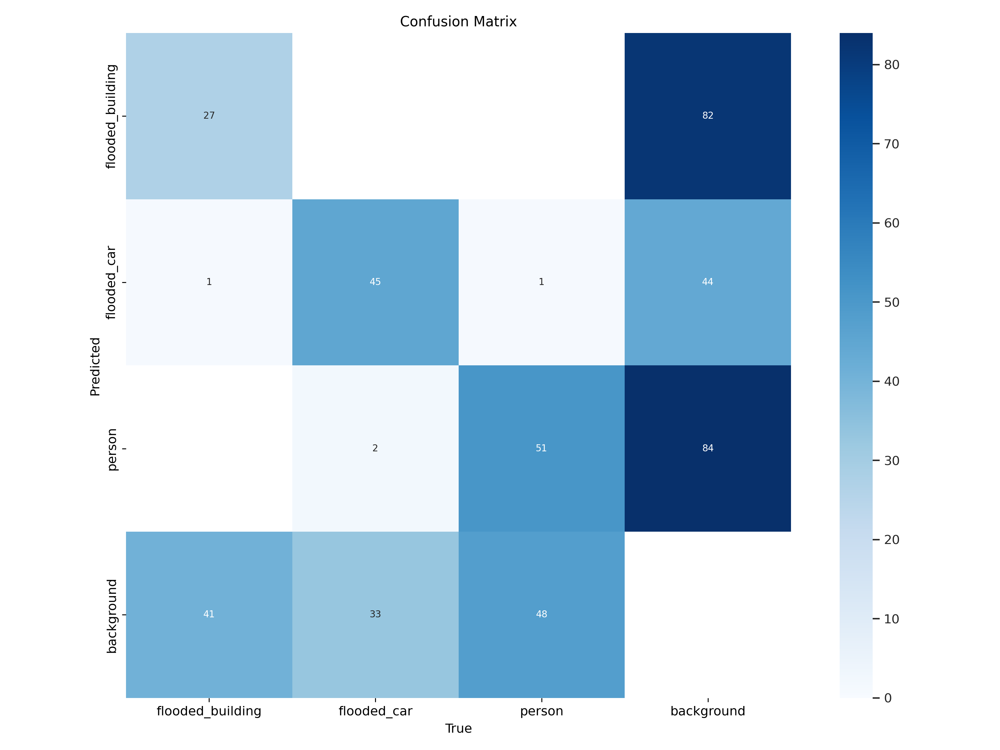

In [20]:

display(Image(filename='/kaggle/working/kag_yolo_runs/flood damage object detection/confusion_matrix.png'))


image 1/32 /kaggle/input/flood-damage-object-detection/Dataset/dataset/test/images/flood_109_png.rf.46563eb62539a9cd4028aedc7f18bbbf.jpg: 640x640 4 flooded_cars, 4 persons, 16.2ms
image 2/32 /kaggle/input/flood-damage-object-detection/Dataset/dataset/test/images/flood_128_png.rf.5ba4d00893a6cbfd160c6aca1f93e079.jpg: 640x640 1 flooded_car, 3 persons, 16.3ms
image 3/32 /kaggle/input/flood-damage-object-detection/Dataset/dataset/test/images/flood_12_png.rf.0b989f7f930153760276c01887af3844.jpg: 640x640 1 flooded_building, 1 flooded_car, 16.1ms
image 4/32 /kaggle/input/flood-damage-object-detection/Dataset/dataset/test/images/flood_177_png.rf.70e15be9104afd149045261198e70ad1.jpg: 640x640 1 flooded_building, 2 flooded_cars, 1 person, 16.2ms
image 5/32 /kaggle/input/flood-damage-object-detection/Dataset/dataset/test/images/flood_1_png.rf.356ba037d536ea0fe93858822181193e.jpg: 640x640 2 flooded_buildings, 16.3ms
image 6/32 /kaggle/input/flood-damage-object-detection/Dataset/dataset/test/images

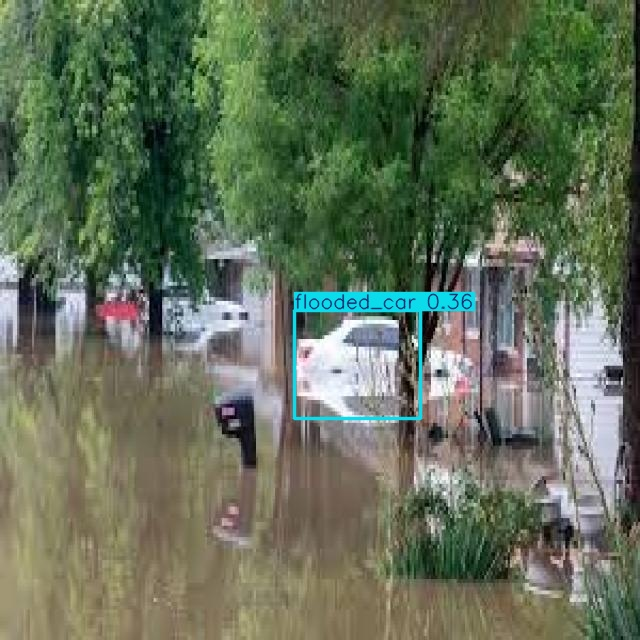

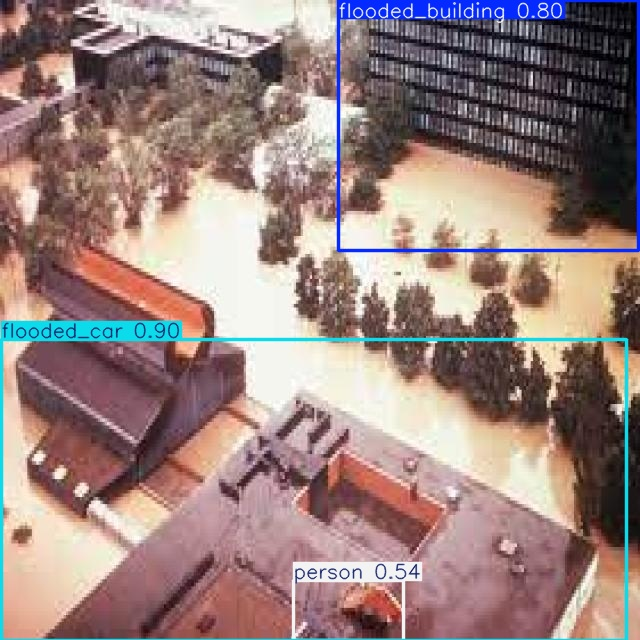

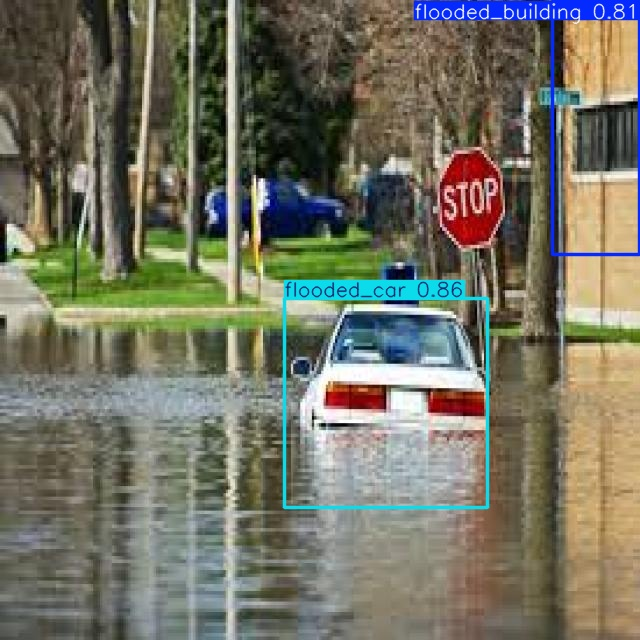

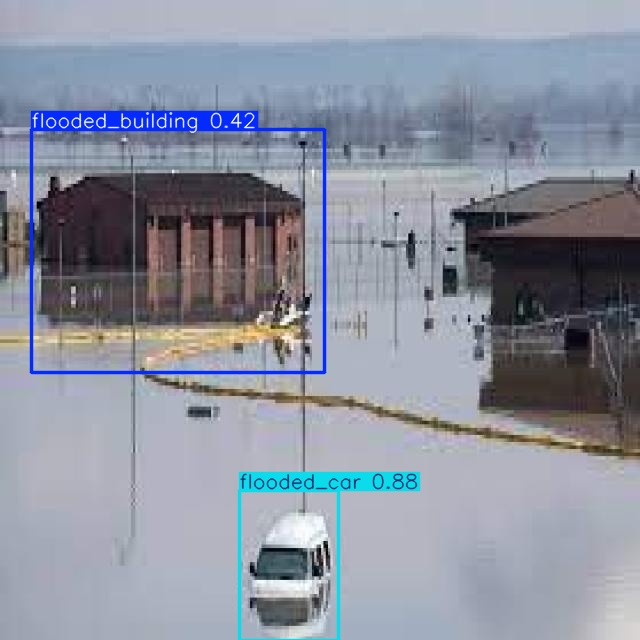

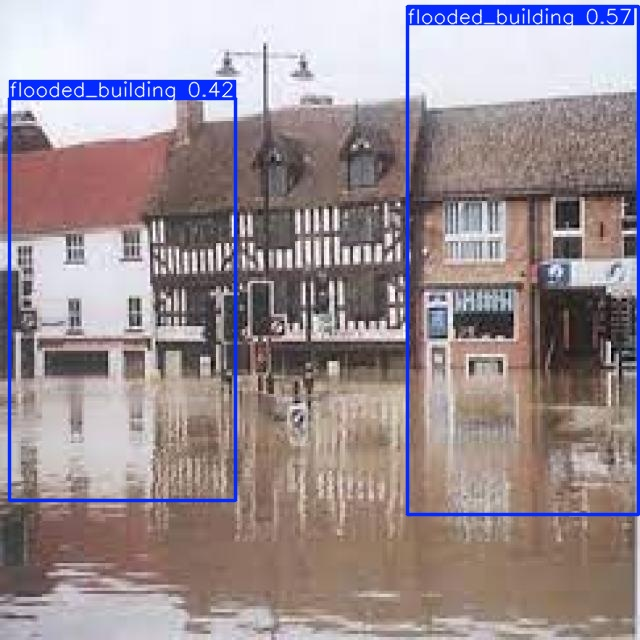

...

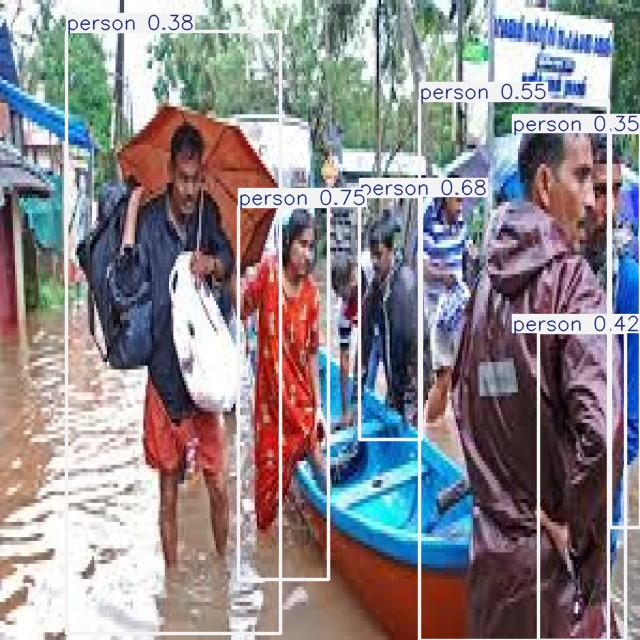

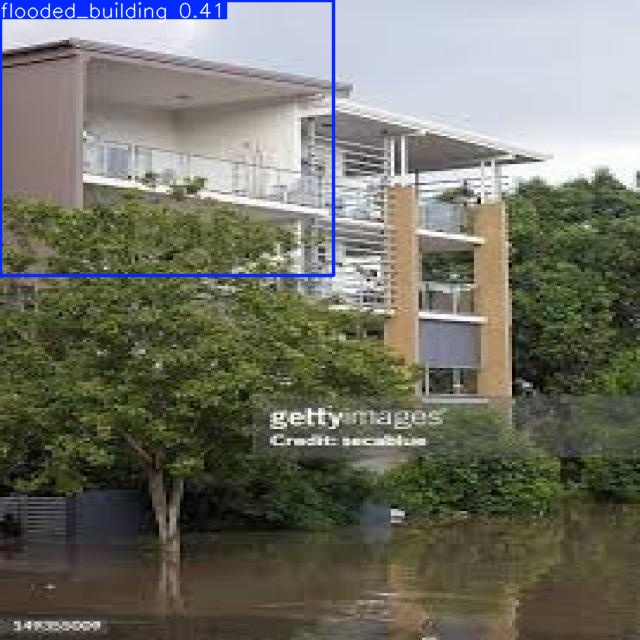

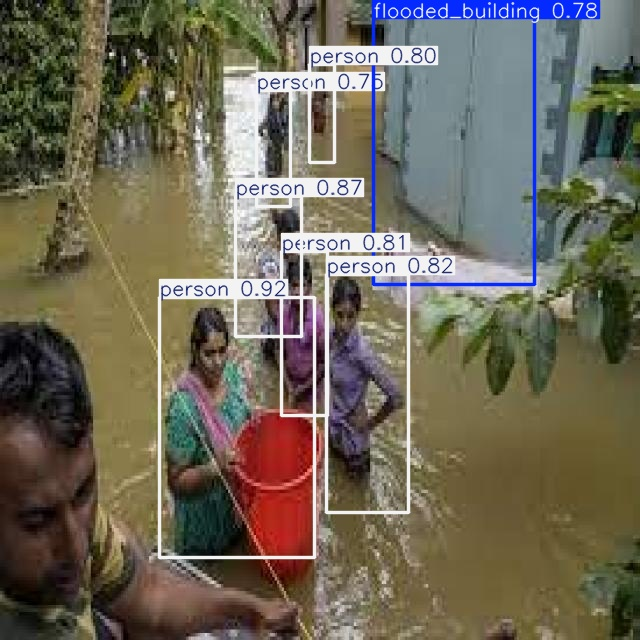

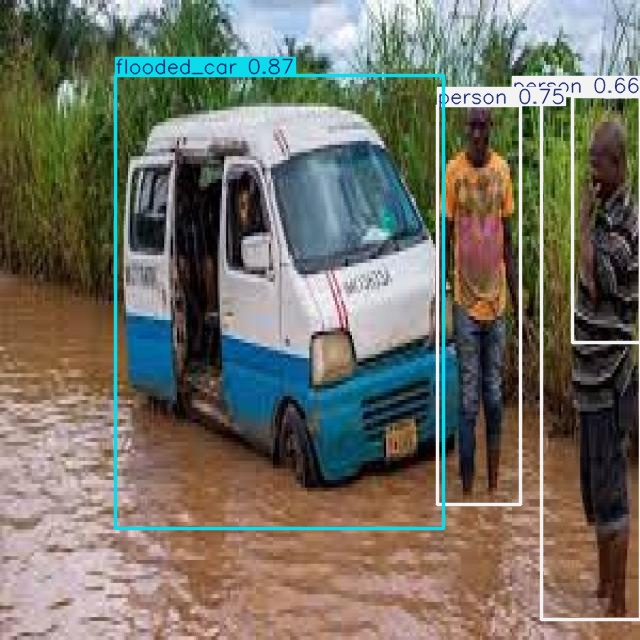

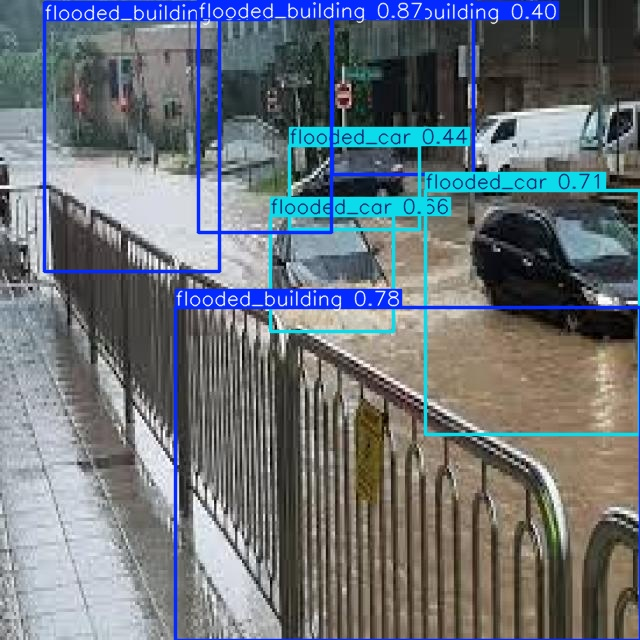

In [27]:
# Load trained model
model = YOLO('/kaggle/working/kag_yolo_runs/flood damage object detection/weights/best.pt')

# Run predictions on a folder or a single image
results = model.predict(source='/kaggle/input/flood-damage-object-detection/Dataset/dataset/test/images', save=True, conf=0.25)

# Get the folder where predictions were saved
# Ultralytics automatically saves to runs/predict/predict, predict2, etc.
save_dir = results[0].save_dir  # Automatically gets the correct directory

# Display a few predicted images
for image_file in os.listdir(save_dir):
    if image_file.endswith((".jpg", ".png", ".jpeg")):
        display(Image(filename=os.path.join(save_dir, image_file)))

Results saved to runs/detect/predict4


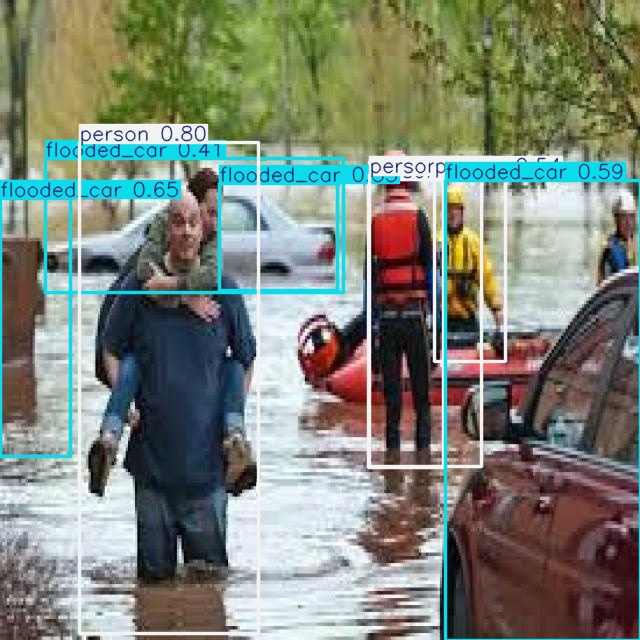

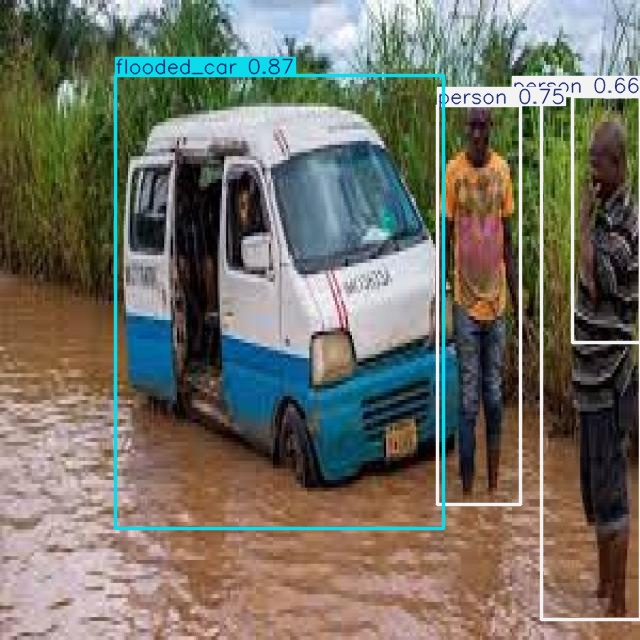

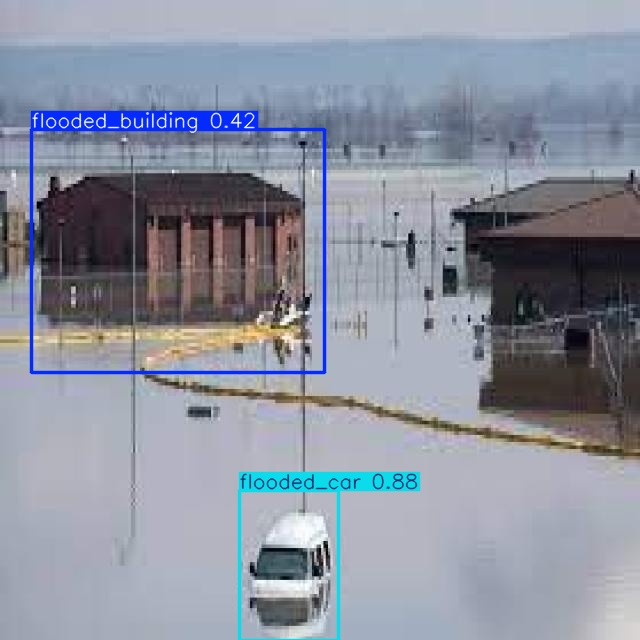

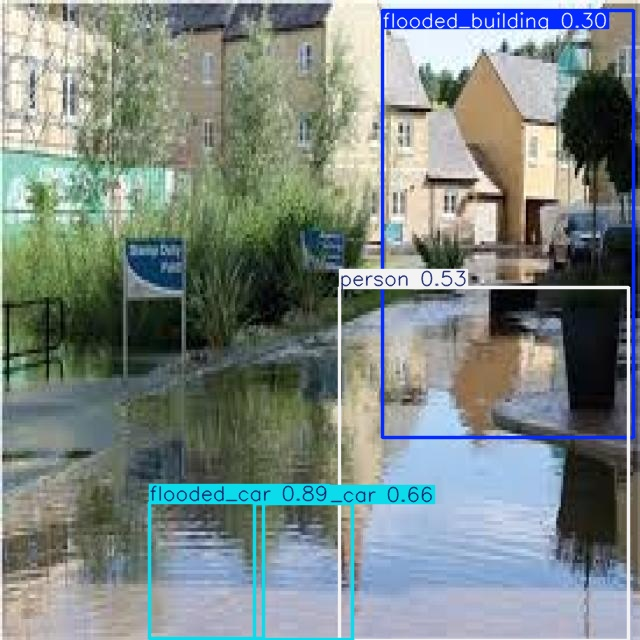

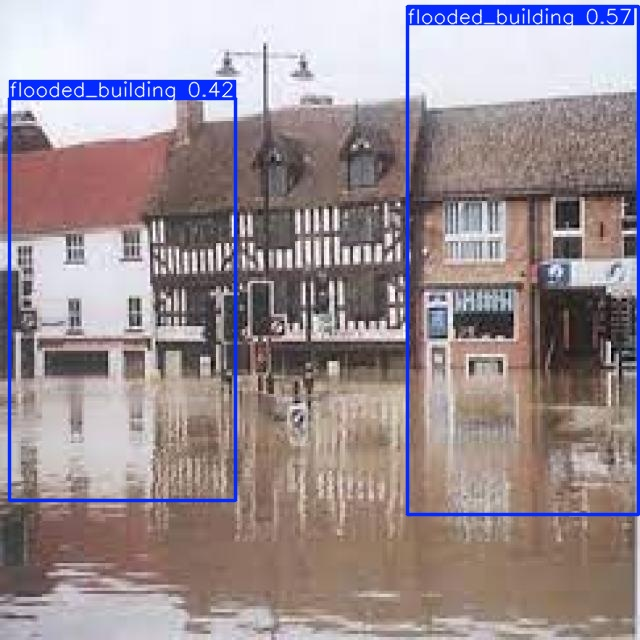

...

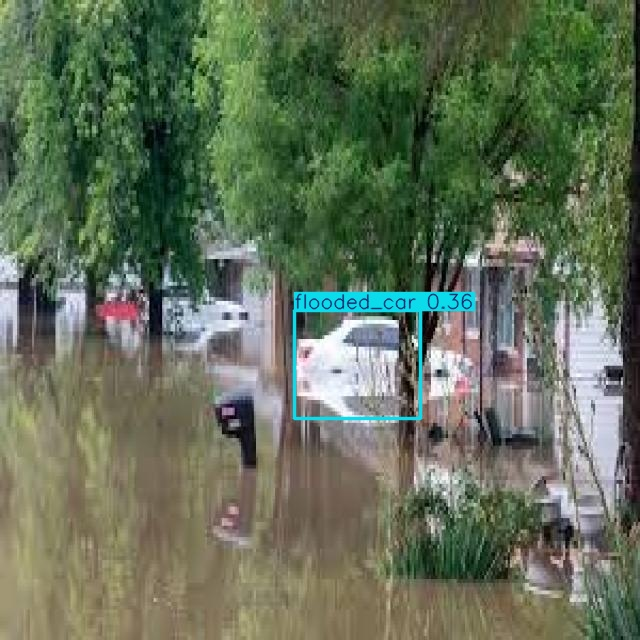

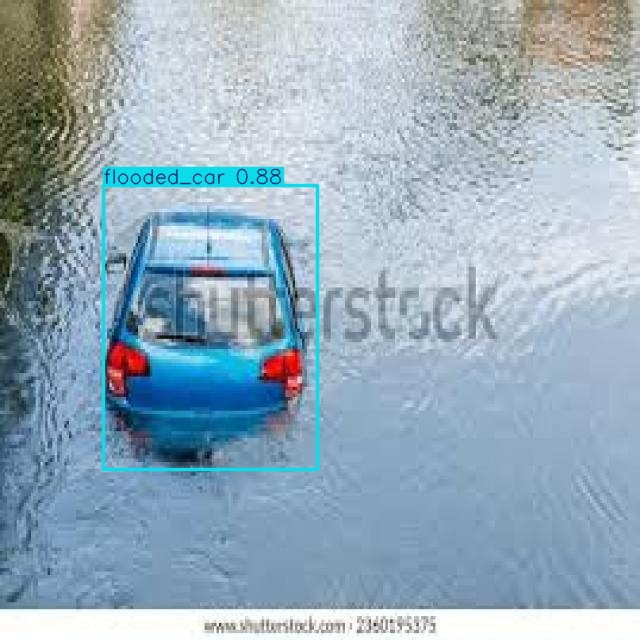

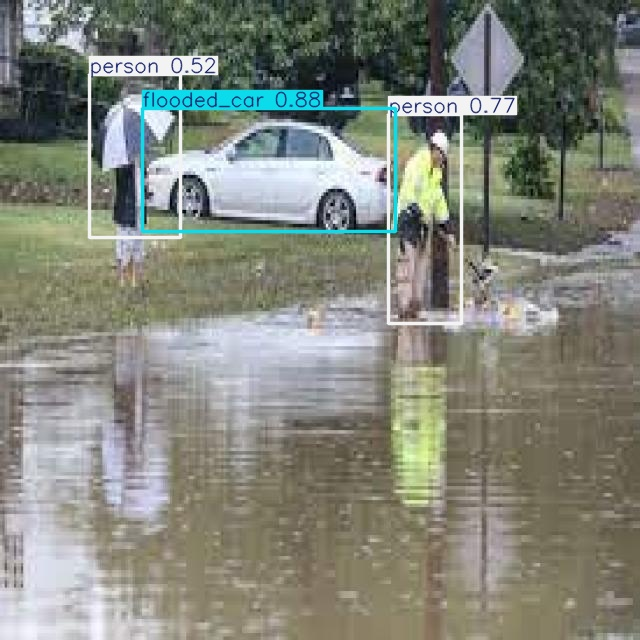

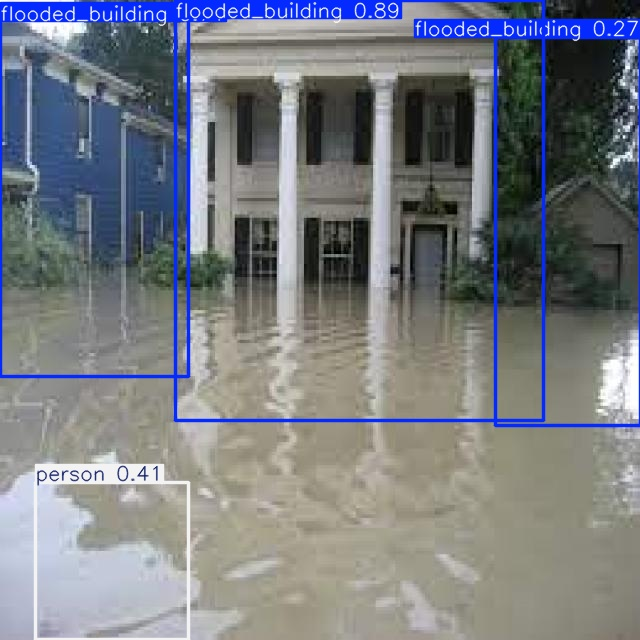

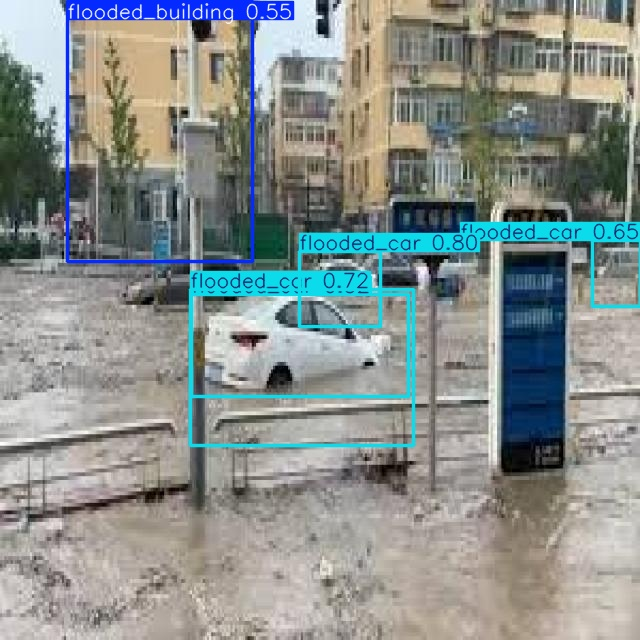

In [30]:
# Load the trained YOLOv8 model
model = YOLO('/kaggle/working/kag_yolo_runs/flood damage object detection/weights/best.pt')

# Run prediction and suppress logs by setting verbose=False
results = model.predict(
    source='/kaggle/input/flood-damage-object-detection/Dataset/dataset/test/images',
    save=True,
    conf=0.25,
    verbose=False  # 👈 This hides the per-image detection logs
)

# Get the directory where prediction images are saved
save_dir = results[0].save_dir

# Display saved images (predictions with labels and boxes)
for image_file in sorted(os.listdir(save_dir)):
    if image_file.lower().endswith((".jpg", ".jpeg", ".png")):
        display(Image(filename=os.path.join(save_dir, image_file)))